In [2]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping

קטגוריה No Tumor - מספר תמונות: 1595
קטגוריה Tumor - מספר תמונות: 4117


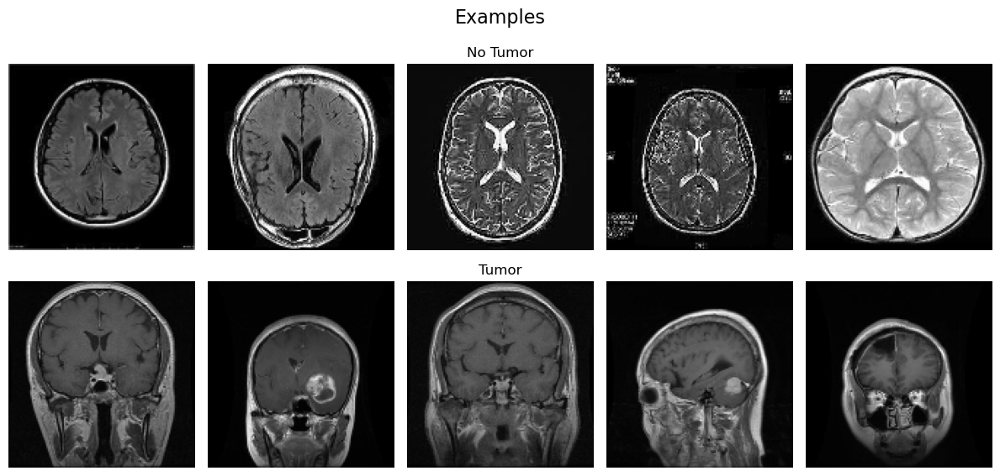

In [3]:
# --- שלב 1: טעינת התמונות ---
base_path ='C:\\Users\\majdm\\Documents\\Digital Sciences for Hitech\\Industry Project\\archive (1)\\Training'
categories = ['meningioma', 'glioma', 'pituitary', 'notumor']
images, labels = [], []

for category in categories:
    folder_path = os.path.join(base_path, category)
    for file in os.listdir(folder_path):
        img_path = os.path.join(folder_path, file)
        img = cv2.imread(img_path)
        img = cv2.resize(img, (128, 128))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = img / 255.0
        images.append(img)
        labels.append(0 if category == 'notumor' else 1)

images = np.array(images)[..., np.newaxis]
labels = np.array(labels)

# --- סטטיסטיקה וויזואליזציה ---
label_names = {0: "No Tumor", 1: "Tumor"}
unique_labels, counts = np.unique(labels, return_counts=True)
for label, count in zip(unique_labels, counts):
    print(f"קטגוריה {label_names[label]} - מספר תמונות: {count}")

plt.figure(figsize=(12, 6))
for label in [0, 1]:
    idxs = np.where(labels == label)[0]
    selected = np.random.choice(idxs, 5, replace=False)
    for i, idx in enumerate(selected):
        plt.subplot(2, 5, label * 5 + i + 1)
        plt.imshow(images[idx].squeeze(), cmap='gray')
        plt.axis('off')
        if i == 2:
            plt.title(f"{label_names[label]}", fontsize=12)
plt.suptitle("Examples", fontsize=16)
plt.tight_layout()
plt.show()

מספר דוגמאות באימון: 4569
מספר דוגמאות בולידציה: 1143


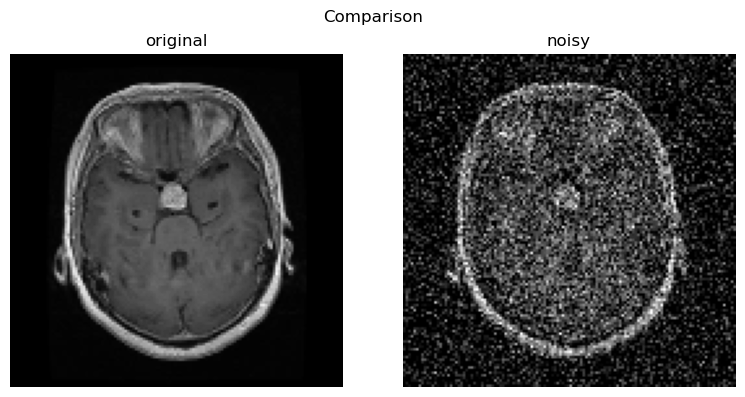

In [4]:
# --- שלב 2: פיצול לסט אימון ווולידציה ---
x_train, x_val, y_train, y_val = train_test_split(
    images, labels, test_size=0.2, random_state=42, stratify=labels
)
print(f"מספר דוגמאות באימון: {len(x_train)}")
print(f"מספר דוגמאות בולידציה: {len(x_val)}")

# --- שלב 3: הוספת רעש גאוסי ---
noise_factor = 0.2
x_train_noisy = x_train + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_train.shape)
x_val_noisy = x_val + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_val.shape)
x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_val_noisy = np.clip(x_val_noisy, 0., 1.)

# --- הדמיה לדוגמה ---
idx = 0
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(x_val[idx].squeeze(), cmap='gray')
plt.title("original")
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(x_val_noisy[idx].squeeze(), cmap='gray')
plt.title("noisy")
plt.axis('off')
plt.suptitle("Comparison")
plt.tight_layout()
plt.show()

In [5]:
# --- שלב 4: בניית המודל ---
input_img = Input(shape=(128, 128, 1))
x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
x = BatchNormalization()(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Dropout(0.2)(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Dropout(0.2)(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
autoencoder = Model(input_img, decoded)


Epoch 1/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 709s 5s/step - loss: 0.0466 - val_loss: 0.7031 - learning_rate: 0.0010
Epoch 2/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 705s 5s/step - loss: 0.0077 - val_loss: 0.7034 - learning_rate: 0.0010
Epoch 3/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 666s 5s/step - loss: 0.0066 - val_loss: 0.5000 - learning_rate: 0.0010
Epoch 4/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 667s 5s/step - loss: 0.0073 - val_loss: 0.0542 - learning_rate: 0.0010
Epoch 5/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 664s 5s/step - loss: 0.0059 - val_loss: 0.0058 - learning_rate: 0.0010
Epoch 6/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 665s 5s/step - loss: 0.0051 - val_loss: 0.0045 - learning_rate: 0.0010
Epoch 7/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 664s 5s/step - loss: 0.0058 - val_loss: 0.0394 - learning_rate: 0.0010
Epoch 8/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 664s 5s/step - loss: 0.0063 - val_loss: 0.0048 - learning_rate: 0.0010
Epoch 9/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 665s 5s/step - loss: 0.0051 - val_loss: 0.0044 - learning_rate: 0.0010
E

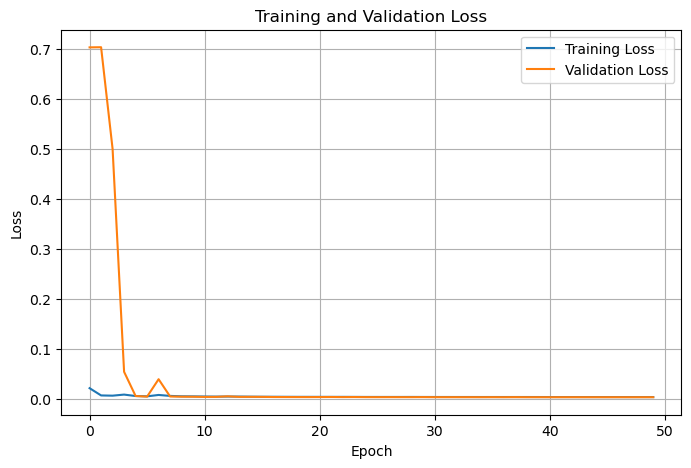

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


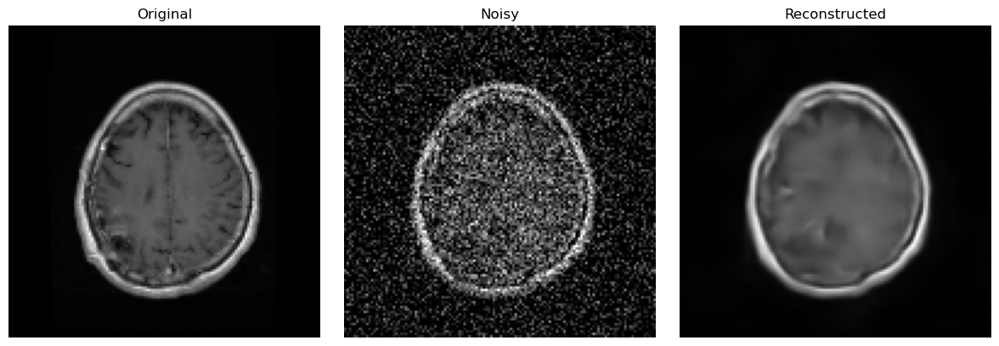

In [6]:
# --- אימון ---
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# קומפילציה עם פונקציית איבוד MSE ואופטימייזר Adam
autoencoder.compile(optimizer='adam', loss='mse')

# Callbacks:
early_stop = EarlyStopping(
    monitor='val_loss',       # ניטור הפסד בוולידציה
    patience=8,              # אם אין שיפור 8 אפוקים – עצור
    restore_best_weights=True  # החזר משקולות מהאפוק הכי טוב
)

lr_schedule = ReduceLROnPlateau(
    monitor='val_loss',       # מעקב אחרי val_loss
    factor=0.5,               # הורד את ה־LR פי 2 כשאין שיפור
    patience=5,               # כמה אפוקים בלי שיפור לפני הורדת LR
    min_lr=1e-6               # קצב למידה מינימלי
)

# התחלת האימון
history = autoencoder.fit(
    x_train_noisy, x_train,
    epochs=50,
    batch_size=32,
    shuffle=True,
    validation_data=(x_val_noisy, x_val),
    callbacks=[early_stop, lr_schedule]
)

# --- גרף איבוד ---
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# --- שחזור תמונה לדוגמה ---
idx = np.random.randint(0, len(x_val_noisy))
noisy_img = x_val_noisy[idx]
clean_img = x_val[idx]
reconstructed_img = autoencoder.predict(noisy_img[np.newaxis, ...])[0]

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(clean_img.squeeze(), cmap='gray')
plt.title('Original')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(noisy_img.squeeze(), cmap='gray')
plt.title('Noisy')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(reconstructed_img.squeeze(), cmap='gray')
plt.title('Reconstructed')
plt.axis('off')
plt.tight_layout()
plt.show()

In [23]:

# ================ 1) Imports & setup =========================
import os
import cv2
import json
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.morphology import remove_small_objects
from skimage.filters import threshold_otsu
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from scipy.ndimage import (binary_closing, binary_opening, binary_erosion,
                           distance_transform_edt, gaussian_filter)

import tensorflow as tf
from tensorflow.keras.layers import (Input, Conv2D, MaxPooling2D, UpSampling2D,
                                     BatchNormalization, Dropout, Concatenate)
from tensorflow.keras.models import Model
import tensorflow.keras.backend as K


In [24]:

# ============ 2) ROI & uncertainty helpers ===================
def normalize(img, eps=1e-8):
    """Safe [0,1] normalization."""
    img = img.astype(np.float32)
    mn, mx = img.min(), img.max()
    if mx - mn < eps:
        return np.zeros_like(img, dtype=np.float32)
    return (img - mn) / (mx - mn + eps)

def sobel_gradient(img):
    """Edge-strength map via Sobel (float32, [0,1])."""
    gx = cv2.Sobel(img.astype(np.float32), cv2.CV_32F, 1, 0, ksize=3)
    gy = cv2.Sobel(img.astype(np.float32), cv2.CV_32F, 0, 1, ksize=3)
    g  = np.sqrt(gx*gx + gy*gy)
    return normalize(g)

def laplacian_map(img):
    """High-frequency (second derivative) magnitude."""
    lap = cv2.Laplacian(img.astype(np.float32), cv2.CV_32F, ksize=3)
    return normalize(np.abs(lap))

def postprocess_mask(mask, min_size=50, do_close=True):
    """Morphological cleanup + removing tiny components."""
    m = (mask > 0).astype(np.uint8)
    if do_close:
        m = binary_closing(m, structure=np.ones((3,3))).astype(np.uint8)
    m = remove_small_objects(m.astype(bool), min_size=min_size).astype(np.uint8)
    return m

def fused_u(residual_norm, gradient_norm, alpha=0.7, smooth_sigma=0.75):
    """
    Fuse residual and gradient uncertainty; light Gaussian smoothing helps stability.
    alpha=0.7 biases towards residual (where model actually erred on calib).
    """
    u = alpha*residual_norm + (1.0 - alpha)*gradient_norm
    if smooth_sigma and smooth_sigma > 0:
        u = gaussian_filter(u.astype(np.float32), sigma=float(smooth_sigma))
    return normalize(u)

def brain_mask_quick(img, erode_px=6):
    """
    Fast brain mask (intensity + morphology).
    Removes skull/background; light erosion keeps ROI away from skull edges.
    """
    x = (img*255).astype(np.uint8)
    thr, _ = cv2.threshold(x, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    m = (x > thr).astype(np.uint8)
    m = binary_closing(m, structure=np.ones((3,3))).astype(np.uint8)
    m = remove_small_objects(m.astype(bool), min_size=int(0.0025*m.size)).astype(np.uint8)
    if m.sum() > 0 and erode_px > 0:
        m = binary_erosion(m, structure=np.ones((erode_px, erode_px))).astype(np.uint8)
        m = binary_opening(m, structure=np.ones((3,3))).astype(np.uint8)
        m = remove_small_objects(m.astype(bool), min_size=int(0.01*m.size)).astype(np.uint8)
    return m

def build_roi_from_map(u_map, threshold='otsu', min_size=50, do_close=True):
    """Threshold uncertainty map to ROI; Otsu by default; clean up."""
    thr = threshold_otsu(u_map) if threshold == 'otsu' else float(threshold)
    roi = (u_map > thr).astype(np.uint8)
    roi = postprocess_mask(roi, min_size=min_size, do_close=do_close)
    return roi

def build_roi_calib(clean_img, recon_img,
                    fuse_alpha=0.7, use_laplace=False,
                    threshold='otsu', min_size_ratio=0.0025,
                    smooth_sigma=0.75):
    """
    ROI for CALIBRATION (you may use clean_img here):
    ũ = fusion(residual, gradient[+laplacian]), masked to brain and away from skull edges.
    Returns (u_tilde, roi, brain_mask).
    """
    H, W = clean_img.shape
    min_size = max(1, int(min_size_ratio*H*W))
    bm = brain_mask_quick(clean_img, erode_px=6)

    residual_norm = normalize(np.abs(clean_img - recon_img))
    grad = sobel_gradient(clean_img)
    if use_laplace:
        grad = normalize(0.7*grad + 0.3*laplacian_map(clean_img))

    u_tilde = fused_u(residual_norm, grad, alpha=fuse_alpha, smooth_sigma=smooth_sigma)
    # suppress skull edges & keep brain only
    dist = distance_transform_edt(bm)
    edge_suppress = np.clip(dist/8.0, 0, 1).astype(np.float32)  # τ≈8px
    u_tilde = u_tilde * edge_suppress * bm

    roi = build_roi_from_map(u_tilde, threshold=threshold, min_size=min_size, do_close=True)
    if roi.sum() == 0:
        valid = (bm == 1)
        thr_fallback = np.quantile(u_tilde[valid], 0.70) if valid.sum() > 0 else np.quantile(u_tilde, 0.75)
        roi = postprocess_mask((u_tilde > thr_fallback).astype(np.uint8), min_size=min_size, do_close=True)
    return u_tilde, roi, bm

def build_roi_valholdout(recon_img,
                         use_laplace=True, threshold='otsu',
                         min_size_ratio=0.0025, smooth_sigma=0.75):
    """
    ROI for VAL/HOLDOUT/TEST (no clean image used):
    ũ derived from recon only (gradient[+laplacian]), masked to brain and away from skull edges.
    """
    H, W = recon_img.shape
    min_size = max(1, int(min_size_ratio*H*W))
    bm = brain_mask_quick(recon_img, erode_px=6)

    grad = sobel_gradient(recon_img)
    if use_laplace:
        grad = normalize(0.7*grad + 0.3*laplacian_map(recon_img))

    # Here residual is unavailable, so ũ is gradient-only (smoothed)
    u_tilde = fused_u(np.zeros_like(grad), grad, alpha=0.0, smooth_sigma=smooth_sigma)
    dist = distance_transform_edt(bm)
    edge_suppress = np.clip(dist/8.0, 0, 1).astype(np.float32)
    u_tilde = u_tilde * edge_suppress * bm

    roi = build_roi_from_map(u_tilde, threshold=threshold, min_size=min_size, do_close=True)
    if roi.sum() == 0:
        valid = (bm == 1)
        thr_fallback = np.quantile(u_tilde[valid], 0.70) if valid.sum() > 0 else np.quantile(u_tilde, 0.75)
        roi = postprocess_mask((u_tilde > thr_fallback).astype(np.uint8), min_size=min_size, do_close=True)
    return u_tilde, roi, bm

In [25]:
# ============ 3) Build CALIB/HOLDOUT from Validation =========
# Focus on tumor images in val, then split them to calib / holdout for RCPS & evaluation.
tumor_idxs = np.where(y_val == 1)[0]
x_val_tumor       = x_val[tumor_idxs]
x_val_noisy_tumor = x_val_noisy[tumor_idxs]

# 60% calib / 40% holdout (adjust as you like)
x_calib, x_val_holdout, x_calib_noisy, x_val_holdout_noisy = train_test_split(
    x_val_tumor, x_val_noisy_tumor, test_size=0.4, random_state=42
)

def make_calib_items_adaptive(x_calib, x_calib_noisy, autoencoder,
                              fuse_alpha=0.7, use_laplace=False,
                              threshold='otsu', min_size_ratio=0.0025,
                              smooth_sigma=0.75, verbose=1):
    """
    Build calibration tuples: (Y, N, Yhat, u_tilde, ROI, brain_mask) per image.
    ROI is computed PER IMAGE (no reuse!), as required.
    """
    items, empty = [], 0
    for i in range(len(x_calib)):
        Y = x_calib[i].squeeze().astype(np.float32)       # clean
        N = x_calib_noisy[i].squeeze().astype(np.float32) # noisy
        Yhat = autoencoder.predict(N[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        u_tilde, roi, bm = build_roi_calib(Y, Yhat,
                                           fuse_alpha=fuse_alpha, use_laplace=use_laplace,
                                           threshold=threshold, min_size_ratio=min_size_ratio,
                                           smooth_sigma=smooth_sigma)
        if roi.sum() == 0:
            empty += 1
        items.append((Y, N, Yhat, u_tilde, roi, bm))
    if verbose:
        print(f"[CALIB] items={len(items)} | empty ROI={empty}")
    return items

calib_items = make_calib_items_adaptive(
    x_calib, x_calib_noisy, autoencoder,
    fuse_alpha=0.7, use_laplace=False, threshold='otsu',
    min_size_ratio=0.0025, smooth_sigma=0.75, verbose=1
)


[CALIB] items=494 | empty ROI=0


In [26]:
# ============ 4) Q_ROI (Step 3): fixed quantile inside ROI ===
def collect_residuals_pool_from_calib(calib_items):
    """Aggregate |Y - Yhat| over all ROI pixels across all calibration images."""
    pool = []
    for (Y, N, Yhat, u, roi, bm) in calib_items:
        pool.append(np.abs(Y - Yhat)[roi == 1])
    return np.concatenate(pool, axis=0) if len(pool) > 0 else np.array([], dtype=np.float32)

def compute_qroi_from_pool(residuals_pool, alpha=0.1):
    """
    Conformal quantile: choose q̂ so that ~ (1-α) of residuals are below it.
    """
    r = residuals_pool.ravel().astype(np.float32)
    N = r.size
    assert N > 0, "Empty residuals pool (check ROI construction / calib split)."
    k = int(np.ceil((N + 1) * (1 - alpha)))
    k = np.clip(k, 1, N)
    return float(np.partition(r, k - 1)[k - 1])

def evaluate_coverage_on_calib(calib_items, q_hat):
    """Coverage & ROI size stats on calib for fixed q̂."""
    covs, ns = [], []
    for (Y, N, Yhat, u, roi, bm) in calib_items:
        T_lo, T_hi = Yhat - q_hat, Yhat + q_hat
        cover = ((Y >= T_lo) & (Y <= T_hi))
        n = int(roi.sum())
        if n > 0:
            covs.append(cover[roi == 1].mean()); ns.append(n)
    covs = np.array(covs); ns = np.array(ns)
    print(f"[Q_ROI Calib] coverage mean={covs.mean():.3f} ± {covs.std():.3f} | images={len(covs)} | median ROI px={np.median(ns):.0f}")
    return covs, ns

def evaluate_coverage_on_val_holdout_qroi(x_val_holdout, x_val_holdout_noisy,
                                          autoencoder, q_hat):
    """Coverage on holdout using ROI from recon only (no clean used to define ROI)."""
    covs, ns = [], []
    for i in range(len(x_val_holdout_noisy)):
        clean = x_val_holdout[i].squeeze().astype(np.float32)
        noisy = x_val_holdout_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        u_tilde, roi, bm = build_roi_valholdout(recon, use_laplace=True, threshold='otsu',
                                                min_size_ratio=0.0025, smooth_sigma=0.75)
        T_lo, T_hi = recon - q_hat, recon + q_hat
        cover = ((clean >= T_lo) & (clean <= T_hi))
        n = int(roi.sum())
        if n > 0:
            covs.append(cover[roi == 1].mean()); ns.append(n)
    covs = np.array(covs); ns = np.array(ns)
    print(f"[Q_ROI Holdout] coverage mean={covs.mean():.3f} ± {covs.std():.3f} | images={len(covs)} | median ROI px={np.median(ns):.0f}")
    return covs, ns

# Run Q_ROI
alpha = 0.1  # target: 90% coverage
pool = collect_residuals_pool_from_calib(calib_items)
q_hat = compute_qroi_from_pool(pool, alpha=alpha)
covs_calib_q, _ = evaluate_coverage_on_calib(calib_items, q_hat)
covs_hold_q, _  = evaluate_coverage_on_val_holdout_qroi(x_val_holdout, x_val_holdout_noisy, autoencoder, q_hat)
print(f"[Q_ROI] alpha={alpha:.2f}, pool_size={pool.size}, q_hat={q_hat:.4f}")


[Q_ROI Calib] coverage mean=0.893 ± 0.050 | images=494 | median ROI px=2162
[Q_ROI Holdout] coverage mean=0.879 ± 0.047 | images=329 | median ROI px=1234
[Q_ROI] alpha=0.10, pool_size=1094199, q_hat=0.1255


In [27]:
# ============ 5) RCPS (Step 4): adaptive intervals =============
def _normalize_safe(x):
    x = x.astype(np.float32)
    mn, mx = x.min(), x.max()
    if mx - mn < 1e-12:
        return np.zeros_like(x, dtype=np.float32)
    return (x - mn) / (mx - mn)

def _empirical_risk_and_width(calib_items, lam, beta, u0):
    """
    Empirical miscoverage + mean width over ROI pixels (averaged per-image for stability).
    """
    misses = 0; total = 0; width_sum = 0.0; n_imgs = 0
    for (Y, N, Yhat, u, roi, bm) in calib_items:
        u_norm = _normalize_safe(u)
        q_pix = lam*(u0 + beta*u_norm)
        T_lo, T_hi = Yhat - q_pix, Yhat + q_pix
        cover = ((Y >= T_lo) & (Y <= T_hi))
        rb = roi.astype(bool)
        n = int(rb.sum())
        if n == 0:
            continue
        misses += int((~cover[rb]).sum())
        total  += n
        width_sum += float((T_hi - T_lo)[rb].mean())
        n_imgs += 1
    emp_risk = misses / max(total, 1)
    avg_width = width_sum / max(n_imgs, 1)
    return emp_risk, avg_width, misses, total

def _ucb(emp_risk, N, delta=0.1):
    """Hoeffding-style upper bound correction."""
    return float(emp_risk + np.sqrt(np.log(1.0/delta) / (2.0*max(int(N),1))))

def calibrate_rcps_adaptive(calib_items, alpha=0.1, delta=0.1,
                            lambda_grid=None, beta_grid=None, u0_grid=None, verbose=1):
    """
    Grid-search for (λ,β,u0):
      - Keep only triplets with UCB(emp_risk) ≤ α (coverage constraint).
      - Among feasible, choose the minimal average width.
    """
    if lambda_grid is None: lambda_grid = np.linspace(0.05, 3.00, 60)
    if beta_grid   is None: beta_grid   = np.linspace(0.00, 2.00, 21)
    if u0_grid     is None: u0_grid     = np.linspace(0.00, 0.30, 16)

    best = {'lam':None,'beta':None,'u0':None,'emp':np.inf,'ub':np.inf,'width':np.inf,'misses':None,'total':None}
    for lam in lambda_grid:
        for beta in beta_grid:
            for u0 in u0_grid:
                emp, width, misses, total = _empirical_risk_and_width(calib_items, lam, beta, u0)
                ub = _ucb(emp, total, delta)
                if ub <= alpha:  # feasible
                    if (width < best['width']) or (width == best['width'] and emp < best['emp']):
                        best.update({'lam':lam,'beta':beta,'u0':u0,'emp':emp,'ub':ub,'width':width,
                                     'misses':misses,'total':total})
    if verbose:
        if best['lam'] is None:
            print("[RCPS] No feasible (λ,β,u0). Expand grids or revisit ROI/u.")
        else:
            print(f"[RCPS] lam={best['lam']:.3f}, beta={best['beta']:.3f}, u0={best['u0']:.3f} | "
                  f"emp={best['emp']:.4f}, UCB={best['ub']:.4f}, width={best['width']:.4f}, N={best['total']}")
    return best

def evaluate_rcps_on_val_holdout(x_val_holdout, x_val_holdout_noisy, autoencoder, lam, beta, u0):
    """Coverage on holdout for adaptive RCPS intervals (ROI from recon only)."""
    covs, ns = [], []
    for i in range(len(x_val_holdout_noisy)):
        clean = x_val_holdout[i].squeeze().astype(np.float32)
        noisy = x_val_holdout_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        u_tilde, roi, bm = build_roi_valholdout(recon, use_laplace=True, threshold='otsu',
                                                min_size_ratio=0.0025, smooth_sigma=0.75)
        u_norm = _normalize_safe(u_tilde)
        q_pix  = lam*(u0 + beta*u_norm)
        T_lo, T_hi = recon - q_pix, recon + q_pix
        cover = ((clean >= T_lo) & (clean <= T_hi))
        n = int(roi.sum())
        if n > 0:
            covs.append(cover[roi == 1].mean()); ns.append(n)
    covs = np.array(covs); ns = np.array(ns)
    print(f"[RCPS Holdout] coverage mean={covs.mean():.3f} ± {covs.std():.3f} | images={len(covs)} | median ROI px={np.median(ns):.0f}")
    return covs, ns

# Calibrate RCPS
best = calibrate_rcps_adaptive(calib_items, alpha=alpha, delta=0.1, verbose=1)
if best['lam'] is not None:
    covs_hold_rcps, _ = evaluate_rcps_on_val_holdout(
        x_val_holdout, x_val_holdout_noisy, autoencoder,
        best['lam'], best['beta'], best['u0']
    )

[RCPS] lam=0.200, beta=1.400, u0=0.180 | emp=0.0978, UCB=0.0989, width=0.2251, N=1094199
[RCPS Holdout] coverage mean=0.837 ± 0.059 | images=329 | median ROI px=1234


In [28]:
# ============ 6) Print succinct comparison Q_ROI vs RCPS =====
if best['lam'] is not None:
    print("\n=== Q_ROI vs. RCPS (Holdout) ===")
    print(f"Q_ROI   : mean coverage={covs_hold_q.mean():.3f} ± {covs_hold_q.std():.3f} | q_hat={q_hat:.4f}")
    print(f"RCPS    : mean coverage={covs_hold_rcps.mean():.3f} ± {covs_hold_rcps.std():.3f} | "
          f"lam={best['lam']:.3f}, beta={best['beta']:.3f}, u0={best['u0']:.3f}")
    print("Note: RCPS should match/exceed target coverage with narrower mean width (see calibrate_rcps log).")



=== Q_ROI vs. RCPS (Holdout) ===
Q_ROI   : mean coverage=0.879 ± 0.047 | q_hat=0.1255
RCPS    : mean coverage=0.837 ± 0.059 | lam=0.200, beta=1.400, u0=0.180
Note: RCPS should match/exceed target coverage with narrower mean width (see calibrate_rcps log).


In [30]:
# ============ 7) Routing + RefineNet (masked loss; Keras3-safe) ===========

def build_routing_mask_from_q(u_tilde, roi, lam, beta, u0, top_p=0.15):
    """
    Routing = top-p of q(x) inside ROI. This focuses the refine loss on the hardest pixels.
    """
    u_norm = _normalize_safe(u_tilde)
    q_pix  = lam*(u0 + beta*u_norm)
    rb = roi.astype(bool)
    if rb.sum() == 0:
        return np.zeros_like(roi, dtype=np.uint8)
    thr = np.quantile(q_pix[rb], 1.0 - top_p)
    m = np.zeros_like(roi, dtype=np.uint8)
    m[(q_pix >= thr) & rb] = 1
    m = postprocess_mask(m, min_size=int(0.0005*m.size), do_close=True)
    return m

def stack_inputs_for_refine(recon, noisy, u_tilde, roi, q_pix=None):
    """
    Build refine input channels.
      Minimal: [recon, noisy, u_tilde, roi]
      Recommended: also include q(x) as 5th channel if available.
    """
    chans = [recon, noisy, u_tilde, roi.astype(np.float32)]
    if q_pix is not None:
        chans.append(q_pix)
    x = np.stack(chans, axis=-1).astype(np.float32)
    # Ensure 2D -> 3D (H,W, C) and values in [0,1]
    return np.clip(x, 0.0, 1.0)

# ---------- Dataset for RefineNet (from CALIB; supervision available) ----------
X_refine, Y_refine, M_refine = [], [], []
if best['lam'] is not None:
    for (Y, N, Yhat, u, roi, bm) in calib_items:
        # RCPS q(x) for routing & as optional input channel
        u_norm = _normalize_safe(u)
        q_pix  = best['lam']*(best['u0'] + best['beta']*u_norm)
        routing = build_routing_mask_from_q(u, roi, best['lam'], best['beta'], best['u0'], top_p=0.15)

        X_refine.append(stack_inputs_for_refine(Yhat, N, u, roi, q_pix=q_pix))
        Y_refine.append(Y[..., None].astype(np.float32))              # (H,W,1)
        M_refine.append(routing[..., None].astype(np.float32))        # (H,W,1)

X_refine = np.array(X_refine, dtype=np.float32) if len(X_refine)>0 else np.zeros((0,1,1,1), np.float32)
Y_refine = np.array(Y_refine, dtype=np.float32) if len(Y_refine)>0 else np.zeros((0,1,1,1), np.float32)
M_refine = np.array(M_refine, dtype=np.float32) if len(M_refine)>0 else np.zeros((0,1,1,1), np.float32)
print("Refine dataset shapes:", X_refine.shape, Y_refine.shape, M_refine.shape)

# ---------- Small U-Net for refinement ----------
def build_refine_net(in_channels=4, input_shape=(128,128)):
    H, W = input_shape
    inp = Input(shape=(H, W, in_channels))

    # Encoder
    c1 = Conv2D(32, 3, activation='relu', padding='same')(inp); c1 = BatchNormalization()(c1)
    c1 = Conv2D(32, 3, activation='relu', padding='same')(c1)
    p1 = MaxPooling2D()(c1)

    c2 = Conv2D(64, 3, activation='relu', padding='same')(p1); c2 = BatchNormalization()(c2)
    c2 = Conv2D(64, 3, activation='relu', padding='same')(c2)
    p2 = MaxPooling2D()(c2)

    # Bottleneck
    b  = Conv2D(128, 3, activation='relu', padding='same')(p2)
    b  = Conv2D(128, 3, activation='relu', padding='same')(b)

    # Decoder
    u2 = UpSampling2D()(b); u2 = Concatenate()([u2, c2])
    c3 = Conv2D(64, 3, activation='relu', padding='same')(u2); c3 = BatchNormalization()(c3)
    c3 = Conv2D(64, 3, activation='relu', padding='same')(c3)

    u1 = UpSampling2D()(c3); u1 = Concatenate()([u1, c1])
    c4 = Conv2D(32, 3, activation='relu', padding='same')(u1); c4 = BatchNormalization()(c4)
    c4 = Conv2D(32, 3, activation='relu', padding='same')(c4)

    out = Conv2D(1, 3, activation='sigmoid', padding='same')(c4)
    return Model(inp, out, name="RefineNet")

# ---------- Masked-MSE as a standard custom loss (no add_loss) ----------
def masked_mse_packed(y_true_packed, y_pred):
    """
    y_true_packed: (..., 2) where:
       channel 0 = clean image (Y)
       channel 1 = mask (routing) in {0,1}
    """
    y_true = y_true_packed[..., :1]
    mask   = y_true_packed[..., 1:]
    num = K.sum(mask * K.square(y_true - y_pred))
    den = K.sum(mask) + K.epsilon()
    return num / den

# ---------- Train RefineNet (if we have samples) ----------
if X_refine.shape[0] > 0:
    # קביעת מספר הערוצים לפי מה שבנינו (4 בסיסי + 1 של q(x) אם קיים)
    in_channels = X_refine.shape[-1]
    H, W = x_val.shape[1], x_val.shape[2]

    refine_net = build_refine_net(in_channels=in_channels, input_shape=(H, W))

    # אורזים את ה־target לערוץ כפול: [Y, mask]
    Y_packed = np.concatenate([Y_refine, M_refine], axis=-1)  # (N,H,W,2)

    refine_net.compile(optimizer='adam', loss=masked_mse_packed)
    refine_net.fit(X_refine, Y_packed, epochs=10, batch_size=8, verbose=1)
else:
    refine_net = None
    print("[Refine] No calib samples to train refine-net (empty ROI/routing?).")

# ---------- Evaluate RefineNet improvement on Val-Holdout ----------
def eval_psnr_ssim_roi(clean, recon, refined, roi):
    rb = roi.astype(bool)
    if rb.sum() == 0:
        return np.nan, np.nan, np.nan, np.nan
    p_recon   = psnr(clean[rb],   recon[rb],   data_range=1.0)
    p_refined = psnr(clean[rb], refined[rb], data_range=1.0)
    s_recon   = ssim(clean, recon,   data_range=1.0, gaussian_weights=True, use_sample_covariance=False, win_size=7)
    s_refined = ssim(clean, refined, data_range=1.0, gaussian_weights=True, use_sample_covariance=False, win_size=7)
    return p_recon, p_refined, s_recon, s_refined

def refine_inference_on_valholdout(x_val_holdout, x_val_holdout_noisy, autoencoder,
                                   refine_net, lam, beta, u0, top_p=0.15):
    dpsnr, dssim = [], []
    for i in range(len(x_val_holdout_noisy)):
        clean = x_val_holdout[i].squeeze().astype(np.float32)
        noisy = x_val_holdout_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        u_tilde, roi, bm = build_roi_valholdout(recon, use_laplace=True, threshold='otsu',
                                                min_size_ratio=0.0025, smooth_sigma=0.75)
        # RCPS q(x) for input channel consistency (optional)
        u_norm = _normalize_safe(u_tilde); q_pix = lam*(u0 + beta*u_norm)

        # Build inputs and run refinement
        X_in = stack_inputs_for_refine(recon, noisy, u_tilde, roi, q_pix=q_pix)
        refined = refine_net.predict(X_in[np.newaxis, ...], verbose=0)[0, ..., 0]

        # Evaluate improvement inside ROI
        p0, p1, s0, s1 = eval_psnr_ssim_roi(clean, recon, refined, roi)
        if not (np.isnan(p0) or np.isnan(p1)):
            dpsnr.append(p1 - p0); dssim.append(s1 - s0)

    if len(dpsnr) > 0:
        print(f"[Refine] ΔPSNR(ROI) mean={np.mean(dpsnr):.3f} dB | ΔSSIM mean={np.mean(dssim):.4f} | n={len(dpsnr)}")
    else:
        print("[Refine] No ROI pixels for evaluation.")
    return dpsnr, dssim

if refine_net is not None and best['lam'] is not None:
    _ = refine_inference_on_valholdout(
        x_val_holdout, x_val_holdout_noisy, autoencoder,
        refine_net, best['lam'], best['beta'], best['u0'], top_p=0.15
    )


Refine dataset shapes: (494, 128, 128, 5) (494, 128, 128, 1) (494, 128, 128, 1)
Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 34s 469ms/step - loss: 0.0379
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 31s 505ms/step - loss: 0.0123
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 32s 519ms/step - loss: 0.0118
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 33s 540ms/step - loss: 0.0130
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 34s 546ms/step - loss: 0.0116
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 34s 541ms/step - loss: 0.0114
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 34s 550ms/step - loss: 0.0110
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 35s 558ms/step - loss: 0.0107
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 38s 615ms/step - loss: 0.0111
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 38s 613ms/step - loss: 0.0103
[Refine] ΔPSNR(ROI) mean=-1.954 dB | ΔSSIM mean=-0.4531 | n=329


In [31]:
# ============ 8) TEST-time helpers (define now, use later) ===
def build_roi_test(recon_img, use_laplace=True, threshold='otsu',
                   min_size_ratio=0.0025, smooth_sigma=0.75):
    """Same as val-holdout ROI (no clean at test)."""
    return build_roi_valholdout(recon_img, use_laplace, threshold, min_size_ratio, smooth_sigma)

def apply_qroi_on_test(x_test, x_test_noisy, autoencoder, q_hat):
    """
    Build interval maps on test with fixed q̂ (if clean available, compute coverage).
    """
    results = []
    for i in range(len(x_test_noisy)):
        clean = x_test[i].squeeze().astype(np.float32) if x_test is not None else None
        noisy = x_test_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        u_tilde, roi, bm = build_roi_test(recon, use_laplace=True, threshold='otsu',
                                          min_size_ratio=0.0025, smooth_sigma=0.75)
        T_lo, T_hi = recon - q_hat, recon + q_hat
        interval_map = (T_hi - T_lo).astype(np.float32); interval_map[roi == 0] = 0.0
        cov = None
        if clean is not None:
            cov = (((clean >= T_lo) & (clean <= T_hi))[roi == 1]).mean() if roi.sum() > 0 else np.nan
        results.append(dict(recon=recon, roi=roi, u_tilde=u_tilde, interval_map=interval_map, coverage=cov))
    return results

def apply_rcps_on_test(x_test, x_test_noisy, autoencoder, lam, beta, u0):
    """
    Build adaptive interval maps on test using RCPS params (if clean available, compute coverage).
    """
    results = []
    for i in range(len(x_test_noisy)):
        clean = x_test[i].squeeze().astype(np.float32) if x_test is not None else None
        noisy = x_test_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        u_tilde, roi, bm = build_roi_test(recon, use_laplace=True, threshold='otsu',
                                          min_size_ratio=0.0025, smooth_sigma=0.75)
        u_norm = _normalize_safe(u_tilde)
        q_pix  = lam*(u0 + beta*u_norm)
        T_lo, T_hi = recon - q_pix, recon + q_pix
        interval_map = (T_hi - T_lo).astype(np.float32); interval_map[roi == 0] = 0.0

        cov = None
        if clean is not None:
            cov = (((clean >= T_lo) & (clean <= T_hi))[roi == 1]).mean() if roi.sum() > 0 else np.nan
        results.append(dict(recon=recon, roi=roi, u_tilde=u_tilde, q_pix=q_pix,
                            interval_map=interval_map, coverage=cov))
    return results

def refine_on_test(x_test, x_test_noisy, autoencoder, refine_net, lam, beta, u0, top_p=0.15):
    """
    Run RefineNet on test using RCPS-driven routing; if clean is available, compute improvements.
    """
    out = []
    for i in range(len(x_test_noisy)):
        clean = x_test[i].squeeze().astype(np.float32) if x_test is not None else None
        noisy = x_test_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        u_tilde, roi, bm = build_roi_test(recon, use_laplace=True, threshold='otsu',
                                          min_size_ratio=0.0025, smooth_sigma=0.75)
        u_norm = _normalize_safe(u_tilde); q_pix = lam*(u0 + beta*u_norm)
        X_in = stack_inputs_for_refine(recon, noisy, u_tilde, roi, q_pix=q_pix)
        refined = refine_net.predict(X_in[np.newaxis, ...], verbose=0)[0, ..., 0]

        metrics = None
        if clean is not None:
            p0 = psnr(clean[roi==1], recon[roi==1], data_range=1.0) if roi.sum()>0 else np.nan
            p1 = psnr(clean[roi==1], refined[roi==1], data_range=1.0) if roi.sum()>0 else np.nan
            s0 = ssim(clean, recon,   data_range=1.0, gaussian_weights=True, use_sample_covariance=False, win_size=7)
            s1 = ssim(clean, refined, data_range=1.0, gaussian_weights=True, use_sample_covariance=False, win_size=7)
            metrics = dict(delta_psnr=p1-p0, delta_ssim=s1-s0, psnr_recon=p0, psnr_refined=p1, ssim_recon=s0, ssim_refined=s1)
        out.append(dict(recon=recon, refined=refined, roi=roi, u_tilde=u_tilde, q_pix=q_pix, metrics=metrics))
    return out

# ====================== END ==================================

In [32]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_cp_case_holdout(i,
                              x_val_holdout, x_val_holdout_noisy,
                              autoencoder,
                              lam, beta, u0,
                              refine_net=None, top_p=0.15,
                              use_laplace=True, threshold='otsu',
                              min_size_ratio=0.0025, smooth_sigma=0.75):
    """
    מציג הכל עבור דוגמה אחת מ-Val-Holdout:
      Clean / Noisy / Recon
      ROI overlay
      u_tilde  (מפת אי-ודאות היריסטית)
      q(x)     (רוחב אינטרוול אדפטיבי)
      Interval map (= 2*q(x)) בתוך ה-ROI
      Routing mask
      Error maps: |Y - Recon| , |Y - Refined| (אם refine_net קיים)
      Refined image (אם קיים)
      Miss map (פיקסלים ב-ROI שלא כוסו)
    """
    # --- נתונים ---
    clean = x_val_holdout[i].squeeze().astype(np.float32)
    noisy = x_val_holdout_noisy[i].squeeze().astype(np.float32)
    recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

    # --- ROI ו-ũ ---
    u_tilde, roi, bm = build_roi_valholdout(recon,
                                            use_laplace=use_laplace,
                                            threshold=threshold,
                                            min_size_ratio=min_size_ratio,
                                            smooth_sigma=smooth_sigma)

    # --- q(x), אינטרוול, כיסוי ---
    u_norm = (u_tilde - u_tilde.min()) / (u_tilde.max() - u_tilde.min() + 1e-8)
    q_pix  = lam * (u0 + beta * u_norm)
    T_lo, T_hi = recon - q_pix, recon + q_pix
    interval_map = (T_hi - T_lo).astype(np.float32)
    interval_map[roi == 0] = 0.0

    cover = ((clean >= T_lo) & (clean <= T_hi))
    miss_map = np.zeros_like(roi, dtype=np.uint8)
    miss_map[(roi == 1) & (~cover)] = 1  # פיקסלים ב-ROI שלא כוסו

    # --- Routing mask (top-p בתוך ROI) ---
    routing = build_routing_mask_from_q(u_tilde, roi, lam, beta, u0, top_p=top_p)

    # --- Refine (אופציונלי) ---
    refined = None
    if refine_net is not None:
        X_in = stack_inputs_for_refine(recon, noisy, u_tilde, roi, q_pix=q_pix)
        refined = refine_net.predict(X_in[np.newaxis, ...], verbose=0)[0, ..., 0]

    # --- שגיאות ---
    err_recon   = np.abs(clean - recon)
    err_refined = np.abs(clean - refined) if refined is not None else None

    # --- ציור ---
    ncols = 6 if refined is None else 8
    plt.figure(figsize=(3.0*ncols, 12))

    # 1: Clean
    plt.subplot(2, ncols, 1); plt.imshow(clean, cmap='gray'); plt.title("Clean"); plt.axis('off')

    # 2: Noisy
    plt.subplot(2, ncols, 2); plt.imshow(noisy, cmap='gray'); plt.title("Noisy"); plt.axis('off')

    # 3: Recon + ROI overlay
    plt.subplot(2, ncols, 3); plt.imshow(recon, cmap='gray'); 
    plt.imshow(roi, cmap='jet', alpha=0.35); plt.title("Recon + ROI"); plt.axis('off')

    # 4: u_tilde
    plt.subplot(2, ncols, 4); plt.imshow(u_tilde, cmap='magma'); plt.title("ũ(x)"); plt.colorbar(); plt.axis('off')

    # 5: q(x)
    plt.subplot(2, ncols, 5); plt.imshow(q_pix, cmap='inferno'); plt.title("q(x) (RCPS)"); plt.colorbar(); plt.axis('off')

    # 6: Interval map
    plt.subplot(2, ncols, 6); plt.imshow(interval_map, cmap='hot'); plt.title("Interval Map (2·q) in ROI"); plt.colorbar(); plt.axis('off')

    # 7: Routing
    plt.subplot(2, ncols, 7); plt.imshow(routing, cmap='gray'); plt.title(f"Routing top-p={top_p}"); plt.axis('off')

    # 8: Miss map (כשלי כיסוי ב-ROI)
    plt.subplot(2, ncols, 8); 
    miss_vis = np.zeros((*roi.shape, 3), dtype=np.float32)
    miss_vis[..., 0] = miss_map  # אדום
    plt.imshow(recon, cmap='gray'); plt.imshow(miss_vis, alpha=0.5); 
    plt.title("Misses in ROI (red)"); plt.axis('off')

    # שורה שנייה: Before/After errors + refined (אם קיים)
    plt.subplot(2, ncols, ncols+1); plt.imshow(err_recon, cmap='viridis'); plt.title("|Clean - Recon|"); plt.colorbar(); plt.axis('off')
    if refined is not None:
        plt.subplot(2, ncols, ncols+2); plt.imshow(err_refined, cmap='viridis'); plt.title("|Clean - Refined|"); plt.colorbar(); plt.axis('off')
        plt.subplot(2, ncols, ncols+3); plt.imshow(refined, cmap='gray'); plt.title("Refined"); plt.axis('off')

    # השוואת כיסוי (סימולציה ויזואלית): צביעת פיקסלים מכוסים/לא מכוסים
    cov_vis = np.zeros((*roi.shape, 3), dtype=np.float32)
    cov_vis[..., 1] = (cover & (roi==1))  # ירוק: מכוסים
    cov_vis[..., 0] = ((~cover) & (roi==1))  # אדום: לא מכוסים

    idx_cov = ncols+4 if refined is not None else ncols+2
    plt.subplot(2, ncols, idx_cov)
    plt.imshow(recon, cmap='gray'); plt.imshow(cov_vis, alpha=0.45)
    plt.title("Coverage in ROI (green) / Misses (red)")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


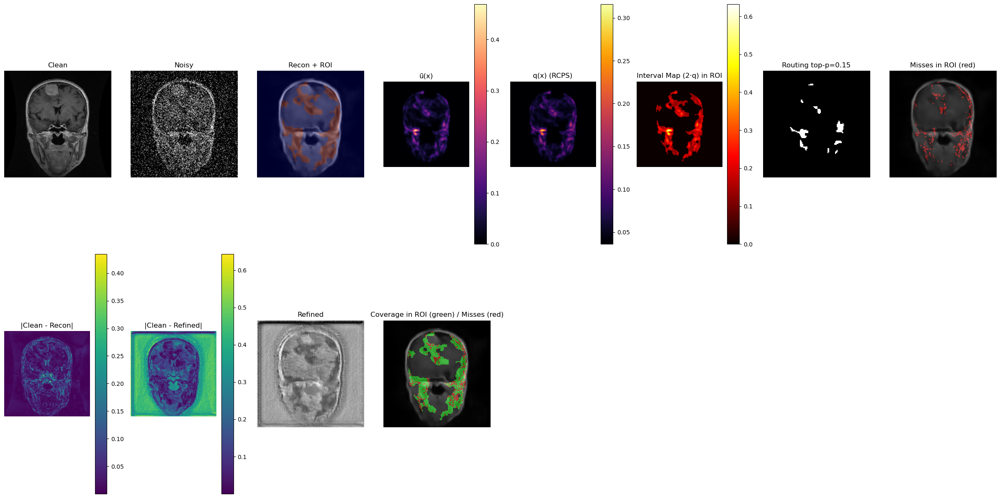

In [33]:
i = np.random.randint(0, len(x_val_holdout_noisy))
visualize_cp_case_holdout(
    i,
    x_val_holdout, x_val_holdout_noisy,
    autoencoder,
    lam=best['lam'], beta=best['beta'], u0=best['u0'],
    refine_net=refine_net,  # או None אם עוד לא אימנת
    top_p=0.15
)


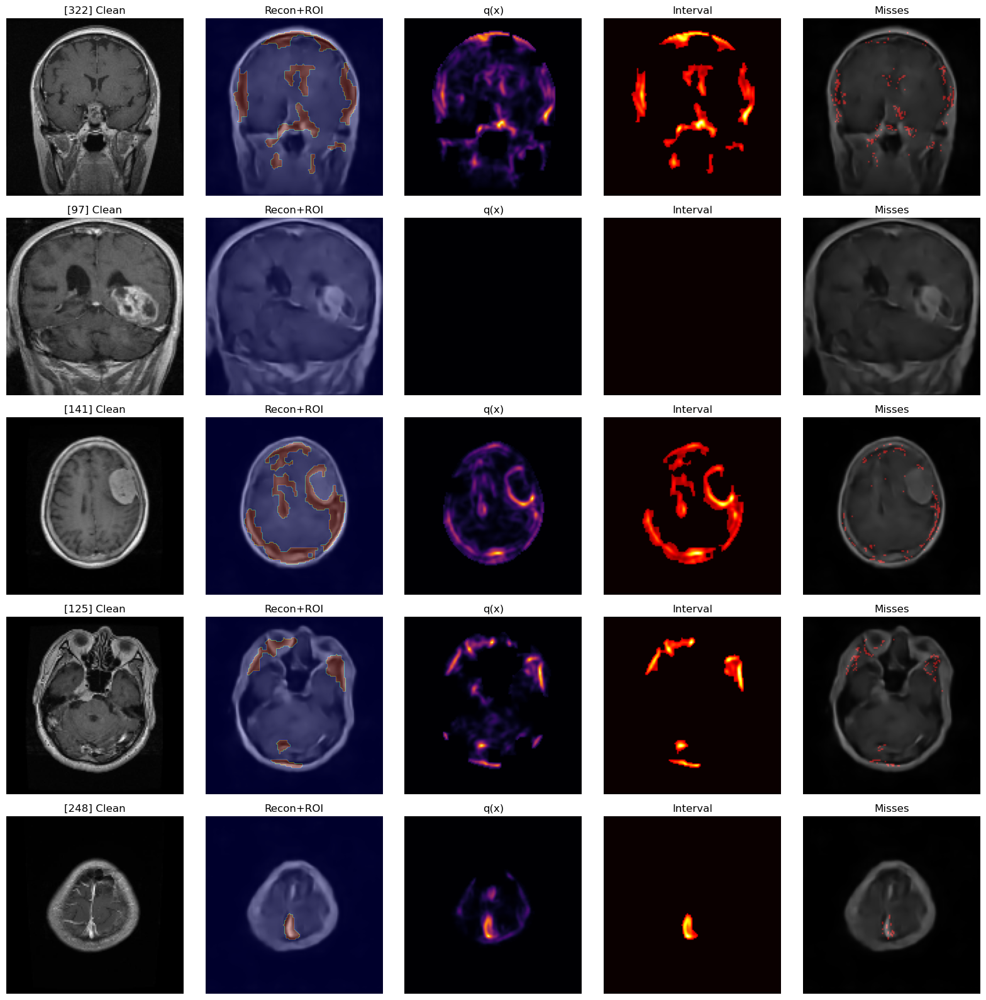

In [34]:
def visualize_cp_gallery_holdout(indices,
                                 x_val_holdout, x_val_holdout_noisy,
                                 autoencoder, lam, beta, u0,
                                 use_laplace=True, threshold='otsu',
                                 min_size_ratio=0.0025, smooth_sigma=0.75):
    """
    מצייר גריד קומפקטי לכמה דוגמאות: Clean / Recon+ROI / q(x) / Interval / Misses
    """
    n = len(indices)
    cols = 5
    plt.figure(figsize=(cols*3.2, n*3.2))
    for row, i in enumerate(indices):
        clean = x_val_holdout[i].squeeze().astype(np.float32)
        noisy = x_val_holdout_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        u_tilde, roi, bm = build_roi_valholdout(recon, use_laplace, threshold, min_size_ratio, smooth_sigma)
        u_norm = (u_tilde - u_tilde.min()) / (u_tilde.max() - u_tilde.min() + 1e-8)
        q_pix  = lam * (u0 + beta * u_norm)
        T_lo, T_hi = recon - q_pix, recon + q_pix
        interval_map = (T_hi - T_lo).astype(np.float32); interval_map[roi == 0] = 0.0
        cover = ((clean >= T_lo) & (clean <= T_hi))
        miss_map = np.zeros_like(roi, dtype=np.uint8); miss_map[(roi == 1) & (~cover)] = 1

        # Clean
        plt.subplot(n, cols, row*cols + 1); plt.imshow(clean, cmap='gray'); plt.title(f"[{i}] Clean"); plt.axis('off')
        # Recon+ROI
        plt.subplot(n, cols, row*cols + 2); plt.imshow(recon, cmap='gray'); plt.imshow(roi, cmap='jet', alpha=0.35); plt.title("Recon+ROI"); plt.axis('off')
        # q(x)
        plt.subplot(n, cols, row*cols + 3); plt.imshow(q_pix, cmap='inferno'); plt.title("q(x)"); plt.axis('off')
        # Interval
        plt.subplot(n, cols, row*cols + 4); plt.imshow(interval_map, cmap='hot'); plt.title("Interval"); plt.axis('off')
        # Misses
        miss_vis = np.zeros((*roi.shape, 3), dtype=np.float32); miss_vis[..., 0] = miss_map
        plt.subplot(n, cols, row*cols + 5); plt.imshow(recon, cmap='gray'); plt.imshow(miss_vis, alpha=0.5); plt.title("Misses"); plt.axis('off')
    plt.tight_layout(); plt.show()

# הרצה לדוגמה:
idxs = np.random.choice(len(x_val_holdout_noisy), size=min(5, len(x_val_holdout_noisy)), replace=False)
visualize_cp_gallery_holdout(idxs, x_val_holdout, x_val_holdout_noisy, autoencoder,
                             lam=best['lam'], beta=best['beta'], u0=best['u0'])


In [39]:
import matplotlib.pyplot as plt
import numpy as np

def show_reconstruction_progress(i, x_val_holdout, x_val_holdout_noisy, autoencoder, refine_net=None):
    """
    מציג עבור תמונה אחת:
      Clean  →  Noisy  →  Recon (Autoencoder)  →  Refined (אחרי שיפור)
    """
    clean = x_val_holdout[i].squeeze().astype(np.float32)
    noisy = x_val_holdout_noisy[i].squeeze().astype(np.float32)

    # שחזור אוטואנקודר
    recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

    # שיפור רשת refinement (אם קיימת)
    refined = None
    if refine_net is not None:
        # הערכת ROI ו־q(x) רק כדי להזין לפונקציה (נשתמש באותם ערכים כמו ב־refine_on_test)
        u_tilde, roi, bm = build_roi_valholdout(recon, use_laplace=True, threshold='otsu',
                                                min_size_ratio=0.0025, smooth_sigma=0.75)
        u_norm = _normalize_safe(u_tilde)
        q_pix = best['lam'] * (best['u0'] + best['beta'] * u_norm)
        X_in = stack_inputs_for_refine(recon, noisy, u_tilde, roi, q_pix=q_pix)
        refined = refine_net.predict(X_in[np.newaxis, ...], verbose=0)[0, ..., 0]

    # ציור 3 או 4 שלבים
    ncols = 4 if refined is not None else 3
    plt.figure(figsize=(4 * ncols, 4))
    plt.subplot(1, ncols, 1); plt.imshow(clean, cmap='gray'); plt.title("Clean"); plt.axis('off')
    plt.subplot(1, ncols, 2); plt.imshow(noisy, cmap='gray'); plt.title("Noisy"); plt.axis('off')
    plt.subplot(1, ncols, 3); plt.imshow(recon, cmap='gray'); plt.title("Reconstructed (AE)"); plt.axis('off')
    if refined is not None:
        plt.subplot(1, ncols, 4); plt.imshow(refined, cmap='gray'); plt.title("Refined (After Improvement)"); plt.axis('off')
    plt.tight_layout()
    plt.show()


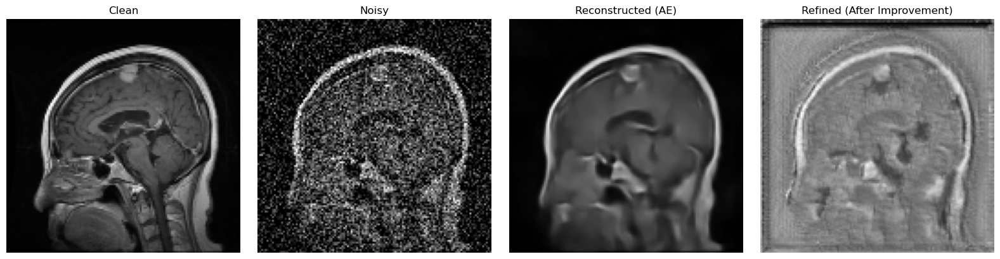

In [40]:
i = np.random.randint(0, len(x_val_holdout_noisy))
show_reconstruction_progress(i, x_val_holdout, x_val_holdout_noisy, autoencoder, refine_net)


In [41]:
import numpy as np
import matplotlib.pyplot as plt

def compute_window(*images, mode='percentile', p=(1, 99), ref='clean'):
    """
    בוחר vmin/vmax משותפים לכל התמונות.
    mode='percentile' -> p=(low, high) בפרצנטילים
    ref in {'clean','recon','all'} – מאיפה לגזור את החלון (רק clean, רק recon, או מכל התמונות יחד).
    """
    assert mode in ('percentile', 'minmax')
    imgs = {}
    for name, im in images:
        if im is not None:
            imgs[name] = np.asarray(im, dtype=np.float32).squeeze()

    if ref == 'clean' and 'clean' in imgs:
        base = imgs['clean']
    elif ref == 'recon' and 'recon' in imgs:
        base = imgs['recon']
    else:
        # מכל התמונות יחד
        base = np.concatenate([im.ravel() for im in imgs.values()])

    if mode == 'percentile':
        vmin, vmax = np.percentile(base, p)
    else:
        vmin, vmax = float(np.min(base)), float(np.max(base))

    # הגנה אם vmin==vmax
    if vmax - vmin < 1e-8:
        vmin, vmax = 0.0, 1.0
    return vmin, vmax

def show_four_fixed_window(clean, noisy, recon, refined,
                           window_mode='percentile', p=(1,99),
                           ref_for_window='clean', title=''):
    """
    מציג Clean/Noisy/Recon/Refined באותה סקאלה בדיוק.
    ref_for_window: 'clean' | 'recon' | 'all'
    """
    vmin, vmax = compute_window(
        ('clean', clean), ('recon', recon), ('refined', refined),
        mode=window_mode, p=p, ref=ref_for_window
    )

    plt.figure(figsize=(16,4))
    ax = plt.subplot(1,4,1); ax.imshow(clean, cmap='gray', vmin=vmin, vmax=vmax); ax.set_title('Clean'); ax.axis('off')
    ax = plt.subplot(1,4,2); ax.imshow(noisy, cmap='gray', vmin=vmin, vmax=vmax); ax.set_title('Noisy'); ax.axis('off')
    ax = plt.subplot(1,4,3); ax.imshow(recon, cmap='gray', vmin=vmin, vmax=vmax); ax.set_title('Reconstructed (AE)'); ax.axis('off')
    ax = plt.subplot(1,4,4); 
    if refined is not None:
        ax.imshow(refined, cmap='gray', vmin=vmin, vmax=vmax); ax.set_title('Refined (same window)'); 
    else:
        ax.imshow(recon, cmap='gray', vmin=vmin, vmax=vmax); ax.set_title('Refined (N/A)'); 
    ax.axis('off')
    if title: plt.suptitle(title, y=0.98)
    plt.tight_layout(); plt.show()

def show_difference_maps(clean, recon, refined=None, roi=None, same_scale=True):
    """
    Heatmaps להשוואה: |clean-recon| ו-|clean-refined| באותה סקאלה אם same_scale=True.
    """
    err_recon = np.abs(clean - recon)
    err_ref   = np.abs(clean - refined) if refined is not None else None

    if same_scale and err_ref is not None:
        vmin = 0.0
        vmax = max(np.percentile(err_recon, 99.5), np.percentile(err_ref, 99.5))
    else:
        vmin = 0.0; vmax = np.percentile(err_recon, 99.5)

    plt.figure(figsize=(12,4))
    ax = plt.subplot(1,3,1); im=ax.imshow(err_recon, cmap='magma', vmin=vmin, vmax=vmax); ax.set_title('|Clean - Recon|'); ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.02)

    ax = plt.subplot(1,3,2)
    if refined is not None:
        im=ax.imshow(err_ref, cmap='magma', vmin=vmin, vmax=vmax); ax.set_title('|Clean - Refined|'); ax.axis('off')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.02)
    else:
        ax.imshow(np.zeros_like(err_recon), cmap='magma', vmin=vmin, vmax=vmax); ax.set_title('Refined N/A'); ax.axis('off')

    ax = plt.subplot(1,3,3)
    if roi is not None:
        base = np.dstack([recon, recon, recon])
        over = base.copy(); over[...,0][roi.astype(bool)] = 1.0
        ax.imshow(base, cmap='gray', vmin=np.min(recon), vmax=np.max(recon))
        ax.imshow(over, alpha=0.35)
        ax.set_title('ROI overlay'); ax.axis('off')
    else:
        ax.axis('off')
    plt.tight_layout(); plt.show()


In [44]:
# ---------- פונקציה מרכזית להרצה על תמונה אחת ----------
def run_refine_once(clean, noisy, autoencoder, refine_net, lam, beta, u0):
    """
    מפעילה AE -> מחשבת ROI ו־u_tilde -> מפיקה q(x) לפי פרמטרי RCPS ->
    ומחזירה גם שחזור משופר (refined) אם הרשת זמינה.
    """
    # AE reconstruction
    recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

    # ROI + ũ (ללא שימוש ב-clean)
    u_tilde, roi, _ = build_roi_valholdout(
        recon,
        use_laplace=True,
        threshold='otsu',
        min_size_ratio=0.0025,
        smooth_sigma=0.75
    )

    # חישוב q(x) לפי RCPS
    u_norm = _normalize_safe(u_tilde)
    q_pix  = lam * (u0 + beta * u_norm)

    # הפעלת רשת השיפור (אם קיימת)
    refined = None
    if refine_net is not None:
        X_in = stack_inputs_for_refine(recon, noisy, u_tilde, roi, q_pix=q_pix)
        refined = refine_net.predict(X_in[np.newaxis, ...], verbose=0)[0, ..., 0].astype(np.float32)

    return recon, refined, roi.astype(bool), q_pix, u_tilde


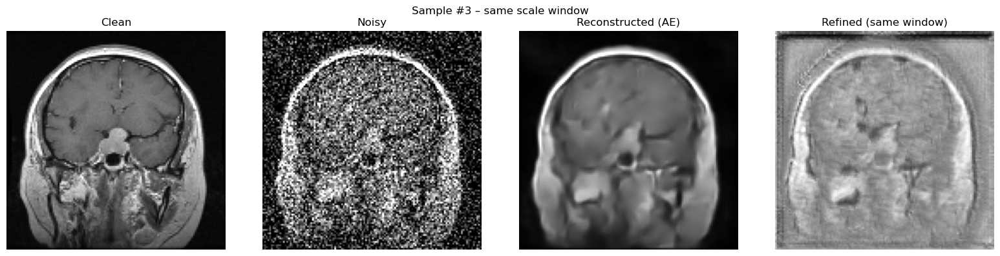

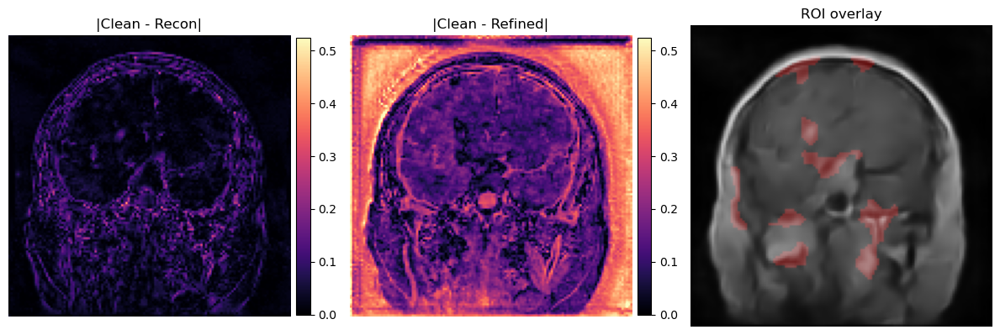

In [45]:
# נבחר תמונה אחת מסט הולד-אאוט
i = 3  # תוכל לשנות את האינדקס
clean = x_val_holdout[i].squeeze().astype(np.float32)
noisy = x_val_holdout_noisy[i].squeeze().astype(np.float32)

# נריץ את ה-AE והרשת המשופרת על אותה תמונה
recon, refined, roi_bool, q_pix, u_tilde = run_refine_once(
    clean, noisy,
    autoencoder, refine_net,
    best['lam'], best['beta'], best['u0']
)

# עכשיו נציג
show_four_fixed_window(clean, noisy, recon, refined,
                       window_mode='percentile', p=(1,99),
                       ref_for_window='clean',
                       title=f"Sample #{i} – same scale window")

show_difference_maps(clean, recon, refined=refined, roi=roi_bool, same_scale=True)


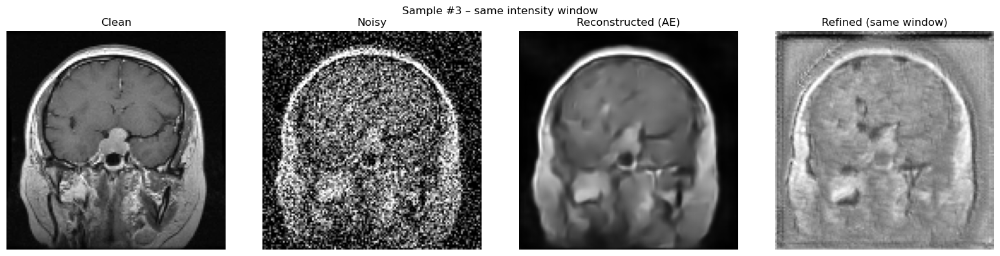

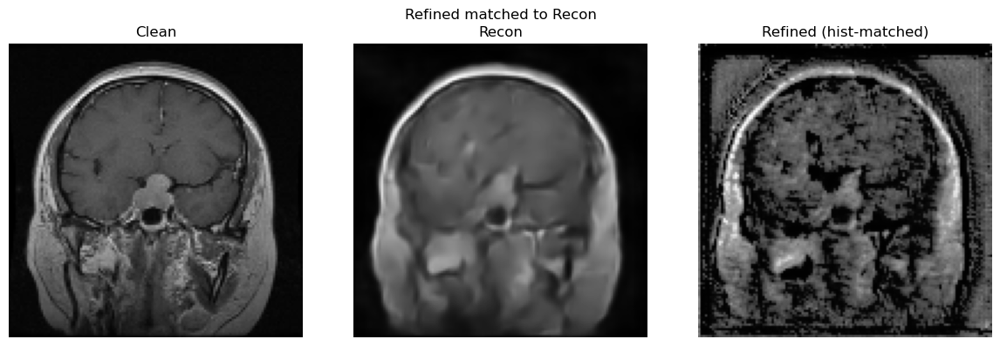

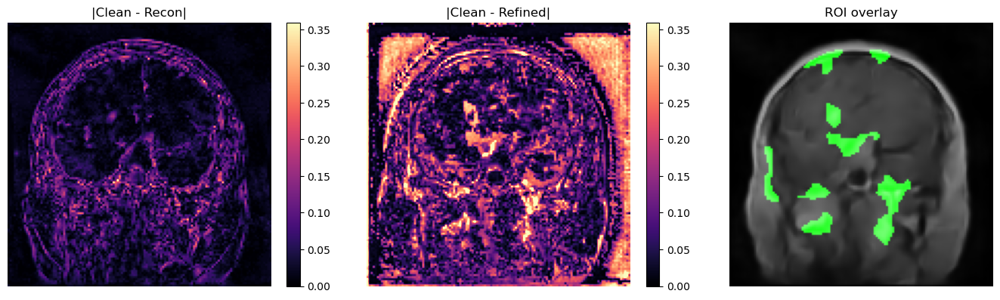

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.exposure import match_histograms

# ----- עוזרים קטנים לתצוגה -----
def fixed_window(img, vmin, vmax):
    img = np.clip((img - vmin) / max(vmax - vmin, 1e-8), 0, 1)
    return img

def show_four_same_window(clean, noisy, recon, refined, ref_for_window='clean', p=(1,99), title=''):
    # קביעת טווח עוצמות אחד לכל התמונות
    ref = clean if ref_for_window=='clean' else recon
    vmin, vmax = np.percentile(ref, p[0]), np.percentile(ref, p[1])

    C = fixed_window(clean,   vmin, vmax)
    N = fixed_window(noisy,   vmin, vmax)
    R = fixed_window(recon,   vmin, vmax)
    F = fixed_window(refined, vmin, vmax)

    fig, axs = plt.subplots(1,4, figsize=(16,4))
    axs[0].imshow(C, cmap='gray'); axs[0].set_title('Clean'); axs[0].axis('off')
    axs[1].imshow(N, cmap='gray'); axs[1].set_title('Noisy'); axs[1].axis('off')
    axs[2].imshow(R, cmap='gray'); axs[2].set_title('Reconstructed (AE)'); axs[2].axis('off')
    axs[3].imshow(F, cmap='gray'); axs[3].set_title('Refined (same window)'); axs[3].axis('off')
    if title: fig.suptitle(title)
    plt.tight_layout(); plt.show()

def show_histogram_matched(clean, recon, refined, title='Refined matched to Recon'):
    # התאמת היסטוגרמה רק להצגה – כך ה-Refined "נראה" כמו ה-Recon מבחינת טון/קונטרסט
    refined_matched = match_histograms(refined, recon, channel_axis=None)
    fig, axs = plt.subplots(1,3, figsize=(12,4))
    axs[0].imshow(clean, cmap='gray'); axs[0].set_title('Clean'); axs[0].axis('off')
    axs[1].imshow(recon, cmap='gray'); axs[1].set_title('Recon'); axs[1].axis('off')
    axs[2].imshow(refined_matched, cmap='gray'); axs[2].set_title('Refined (hist-matched)'); axs[2].axis('off')
    if title: fig.suptitle(title)
    plt.tight_layout(); plt.show()
    return refined_matched

def show_diff_maps(clean, recon, refined, roi=None, same_scale=True):
    # מפות |clean - recon| ו-|clean - refined|
    err_recon   = np.abs(clean - recon)
    err_refined = np.abs(clean - refined)
    if same_scale:
        vmax = np.percentile(np.concatenate([err_recon.ravel(), err_refined.ravel()]), 99)
        vmin = 0.0
    else:
        vmin, vmax = 0.0, None

    fig, axs = plt.subplots(1,3, figsize=(14,4))
    im0 = axs[0].imshow(err_recon, cmap='magma', vmin=vmin, vmax=vmax); axs[0].set_title('|Clean - Recon|'); axs[0].axis('off'); plt.colorbar(im0, ax=axs[0], fraction=0.046)
    im1 = axs[1].imshow(err_refined, cmap='magma', vmin=vmin, vmax=vmax); axs[1].set_title('|Clean - Refined|'); axs[1].axis('off'); plt.colorbar(im1, ax=axs[1], fraction=0.046)
    # ROI overlay (אם יש)
    base = 0.6*fixed_window(recon, *np.percentile(recon, (1,99)))
    if roi is not None:
        overlay = np.dstack([base, base, base])
        overlay[...,1][roi] = 1.0  # ירוק מעל ROI
        axs[2].imshow(overlay); axs[2].set_title('ROI overlay'); axs[2].axis('off')
    else:
        axs[2].imshow(base, cmap='gray'); axs[2].set_title('Recon (base)'); axs[2].axis('off')
    plt.tight_layout(); plt.show()

# ----- דוגמת שימוש אצלך -----
i = 3  # תוכל לשנות
clean = x_val_holdout[i].squeeze().astype(np.float32)
noisy = x_val_holdout_noisy[i].squeeze().astype(np.float32)

# נריץ AE + refine (סוגר חסר תוקן!)
recon, refined, roi_bool, q_pix, u_tilde = run_refine_once(
    clean, noisy, autoencoder, refine_net, best['lam'], best['beta'], best['u0']
)

# 1) תצוגה באותו window לכולם (לפי clean)
show_four_same_window(clean, noisy, recon, refined,
                      ref_for_window='clean', p=(1,99),
                      title=f"Sample #{i} – same intensity window")

# 2) refined עם התאמת היסטוגרמה ל-recon (רק להצגה)
refined_vis = show_histogram_matched(clean, recon, refined)

# 3) מפות הפרש + ROI
show_diff_maps(clean, recon, refined_vis, roi=roi_bool, same_scale=True)


In [47]:
from tensorflow.keras.layers import Lambda, Add, Activation

def build_refine_net_residual(in_channels=4, input_shape=(128,128), r_scale=0.2):
    H, W = input_shape
    inp = Input(shape=(H, W, in_channels))

    # ---- Encoder/Decoder בדיוק כמו קודם ----
    c1 = Conv2D(32, 3, activation='relu', padding='same')(inp); c1 = BatchNormalization()(c1)
    c1 = Conv2D(32, 3, activation='relu', padding='same')(c1);  p1 = MaxPooling2D()(c1)
    c2 = Conv2D(64, 3, activation='relu', padding='same')(p1);   c2 = BatchNormalization()(c2)
    c2 = Conv2D(64, 3, activation='relu', padding='same')(c2);   p2 = MaxPooling2D()(c2)
    b  = Conv2D(128, 3, activation='relu', padding='same')(p2);  b  = Conv2D(128, 3, activation='relu', padding='same')(b)
    u2 = UpSampling2D()(b); u2 = Concatenate()([u2, c2])
    c3 = Conv2D(64, 3, activation='relu', padding='same')(u2);   c3 = BatchNormalization()(c3)
    c3 = Conv2D(64, 3, activation='relu', padding='same')(c3)
    u1 = UpSampling2D()(c3); u1 = Concatenate()([u1, c1])
    c4 = Conv2D(32, 3, activation='relu', padding='same')(u1);   c4 = BatchNormalization()(c4)
    c4 = Conv2D(32, 3, activation='relu', padding='same')(c4)

    # ---- פלט רזידואלי ----
    r = Conv2D(1, 3, activation='tanh', padding='same')(c4)          # r in [-1,1]
    r = Lambda(lambda t: t * r_scale)(r)                              # מגביל תיקון

    # ---- לחלץ את ערוץ ה-Recon מהקלט (ערוץ 0) ----
    recon_inp = Lambda(lambda t: t[..., :1])(inp)

    # ---- refined = recon + r, ואז קליפ עדין ל[0,1] ----
    refined = Add()([recon_inp, r])
    refined = Activation('sigmoid')(refined)

    return Model(inp, refined, name="RefineNetResidual")


In [ ]:
refine_net = build_refine_net_residual(in_channels=in_channels, input_shape=(H, W))


In [59]:
from tensorflow.keras.layers import Lambda, Add, Activation

def build_refine_net_residual(in_channels=4, input_shape=(128,128), r_scale=0.2):
    H, W = input_shape
    inp = Input(shape=(H, W, in_channels))

    # ---- Encoder/Decoder בדיוק כמו קודם ----
    c1 = Conv2D(32, 3, activation='relu', padding='same')(inp); c1 = BatchNormalization()(c1)
    c1 = Conv2D(32, 3, activation='relu', padding='same')(c1);  p1 = MaxPooling2D()(c1)
    c2 = Conv2D(64, 3, activation='relu', padding='same')(p1);   c2 = BatchNormalization()(c2)
    c2 = Conv2D(64, 3, activation='relu', padding='same')(c2);   p2 = MaxPooling2D()(c2)
    b  = Conv2D(128, 3, activation='relu', padding='same')(p2);  b  = Conv2D(128, 3, activation='relu', padding='same')(b)
    u2 = UpSampling2D()(b); u2 = Concatenate()([u2, c2])
    c3 = Conv2D(64, 3, activation='relu', padding='same')(u2);   c3 = BatchNormalization()(c3)
    c3 = Conv2D(64, 3, activation='relu', padding='same')(c3)
    u1 = UpSampling2D()(c3); u1 = Concatenate()([u1, c1])
    c4 = Conv2D(32, 3, activation='relu', padding='same')(u1);   c4 = BatchNormalization()(c4)
    c4 = Conv2D(32, 3, activation='relu', padding='same')(c4)

    # ---- פלט רזידואלי ----
    r = Conv2D(1, 3, activation='tanh', padding='same')(c4)          # r in [-1,1]
    r = Lambda(lambda t: t * r_scale)(r)                              # מגביל תיקון

    # ---- לחלץ את ערוץ ה-Recon מהקלט (ערוץ 0) ----
    recon_inp = Lambda(lambda t: t[..., :1])(inp)

    # ---- refined = recon + r, ואז קליפ עדין ל[0,1] ----
    refined = Add()([recon_inp, r])
    refined = Activation('sigmoid')(refined)

    return Model(inp, refined, name="RefineNetResidual")


In [60]:
import numpy as np

def match_mean_std(src, ref, mask=None, eps=1e-8):
    """
    מחזיר גרסה של src שמותאמת סטטיסטית ל-ref (ממוצע וסטיית תקן).
    אם יש mask (ROI/brain), ההתאמה תיעשה רק עליו.
    """
    if mask is None:
        m_src = float(src.mean());  s_src = float(src.std() + eps)
        m_ref = float(ref.mean());  s_ref = float(ref.std() + eps)
    else:
        msrc = src[mask > 0]; mref = ref[mask > 0]
        m_src = float(msrc.mean()); s_src = float(msrc.std() + eps)
        m_ref = float(mref.mean()); s_ref = float(mref.std() + eps)

    out = (src - m_src) / s_src * s_ref + m_ref
    return np.clip(out, 0.0, 1.0).astype(np.float32)


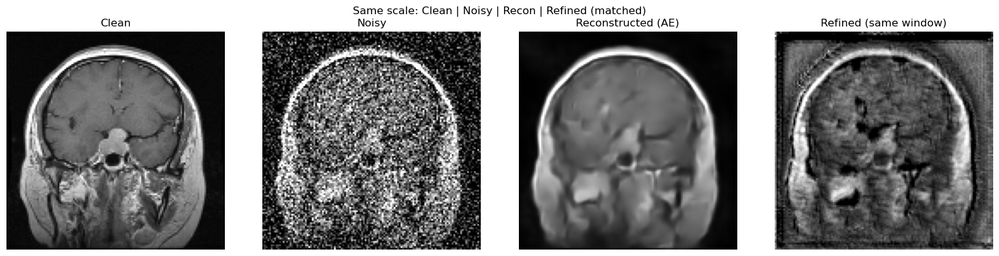

In [53]:
# אם יש לך גם ROI כדאי להשתמש בו להתאמה ממוקדת:
# refined_vis = match_mean_std(refined, recon, mask=roi_bool)
refined_vis = match_mean_std(refined, recon)

show_four_fixed_window(clean, noisy, recon, refined_vis,
                       window_mode='percentile', p=(1, 99),
                       ref_for_window='clean',
                       title='Same scale: Clean | Noisy | Recon | Refined (matched)')


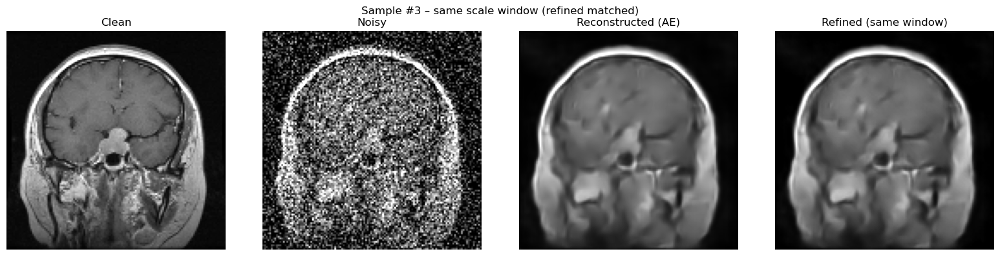

In [54]:
i = 3  # שַׁנֶּה כרצונך
clean = x_val_holdout[i].squeeze().astype(np.float32)
noisy = x_val_holdout_noisy[i].squeeze().astype(np.float32)

# הפקה (AE + RefineNet הרזידואלית)
recon, refined, roi_bool, q_pix, u_tilde = run_refine_once(
    clean, noisy, autoencoder, refine_net,
    best['lam'], best['beta'], best['u0']
)

# התאמת קונטרסט ל-recon (עדיף בתוך ה-ROI אם יש)
refined_vis = match_mean_std(refined, recon, mask=roi_bool)

show_four_fixed_window(clean, noisy, recon, refined_vis,
                       window_mode='percentile', p=(1, 99),
                       ref_for_window='clean',
                       title=f"Sample #{i} – same scale window (refined matched)")


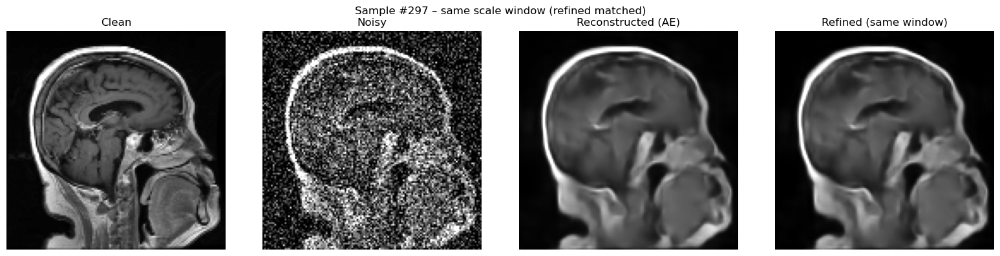

In [58]:
i = 297  # שַׁנֶּה כרצונך
clean = x_val_holdout[i].squeeze().astype(np.float32)
noisy = x_val_holdout_noisy[i].squeeze().astype(np.float32)

# הפקה (AE + RefineNet הרזידואלית)
recon, refined, roi_bool, q_pix, u_tilde = run_refine_once(
    clean, noisy, autoencoder, refine_net,
    best['lam'], best['beta'], best['u0']
)

# התאמת קונטרסט ל-recon (עדיף בתוך ה-ROI אם יש)
refined_vis = match_mean_std(refined, recon, mask=roi_bool)

show_four_fixed_window(clean, noisy, recon, refined_vis,
                       window_mode='percentile', p=(1, 99),
                       ref_for_window='clean',
                       title=f"Sample #{i} – same scale window (refined matched)")


In [42]:
show_four_fixed_window(clean, noisy, recon, refined,
                       window_mode='percentile', p=(1,99), ref_for_window='clean',
                       title='Fixed window – compare fairly')

show_difference_maps(clean, recon, refined=refined, roi=roi_bool, same_scale=True)


NameError: name 'clean' is not defined

קטגוריה No Tumor - מספר תמונות: 405
קטגוריה Tumor - מספר תמונות: 906


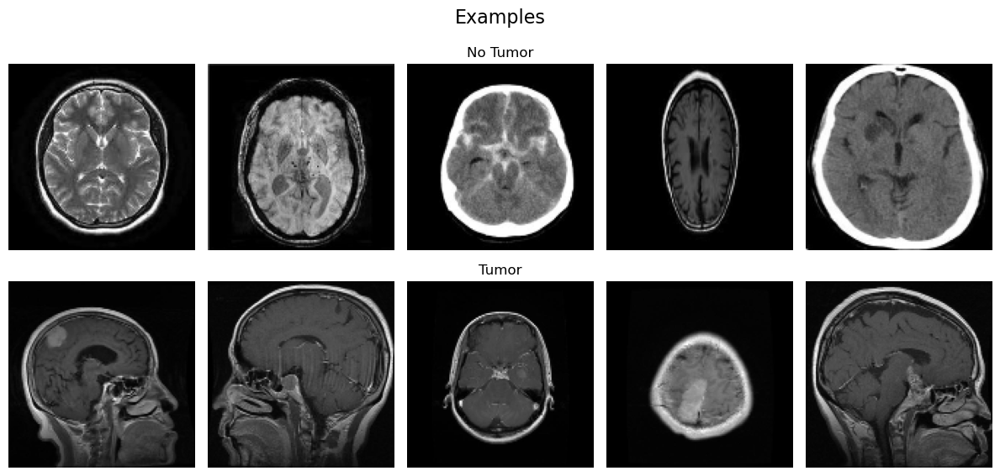

In [63]:
# --- שלב 1: טעינת התמונות ---
base_path ='C:\\Users\\majdm\\Documents\\Digital Sciences for Hitech\\Industry Project\\archive (1)\\Testing'
categories = ['meningioma', 'glioma', 'pituitary', 'notumor']
images, labels = [], []

for category in categories:
    folder_path = os.path.join(base_path, category)
    for file in os.listdir(folder_path):
        img_path = os.path.join(folder_path, file)
        img = cv2.imread(img_path)
        img = cv2.resize(img, (128, 128))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = img / 255.0
        images.append(img)
        labels.append(0 if category == 'notumor' else 1)

images = np.array(images)[..., np.newaxis]
labels = np.array(labels)

# --- סטטיסטיקה וויזואליזציה ---
label_names = {0: "No Tumor", 1: "Tumor"}
unique_labels, counts = np.unique(labels, return_counts=True)
for label, count in zip(unique_labels, counts):
    print(f"קטגוריה {label_names[label]} - מספר תמונות: {count}")

plt.figure(figsize=(12, 6))
for label in [0, 1]:
    idxs = np.where(labels == label)[0]
    selected = np.random.choice(idxs, 5, replace=False)
    for i, idx in enumerate(selected):
        plt.subplot(2, 5, label * 5 + i + 1)
        plt.imshow(images[idx].squeeze(), cmap='gray')
        plt.axis('off')
        if i == 2:
            plt.title(f"{label_names[label]}", fontsize=12)
plt.suptitle("Examples", fontsize=16)
plt.tight_layout()
plt.show()

[TEST] Noisy input ready: (1311, 128, 128, 1)
41/41 ━━━━━━━━━━━━━━━━━━━━ 38s 892ms/step
[TEST] Reconstructions: (1311, 128, 128)


C:\Users\majdm\AppData\Local\Temp\ipykernel_1608\1514943296.py:13: RuntimeWarning: Mean of empty slice.
  m_src = float(msrc.mean()); s_src = float(msrc.std() + eps)
c:\Users\majdm\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\majdm\anaconda3\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\majdm\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\majdm\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\majdm\AppData\Local\Temp\ipykernel_1608\1514943296.py:14: RuntimeWarning: Mean of empty slice.
  m_ref = float(mref.mean()); s_ref = float(mref.std

[TEST] Refined results ready: 1311 images


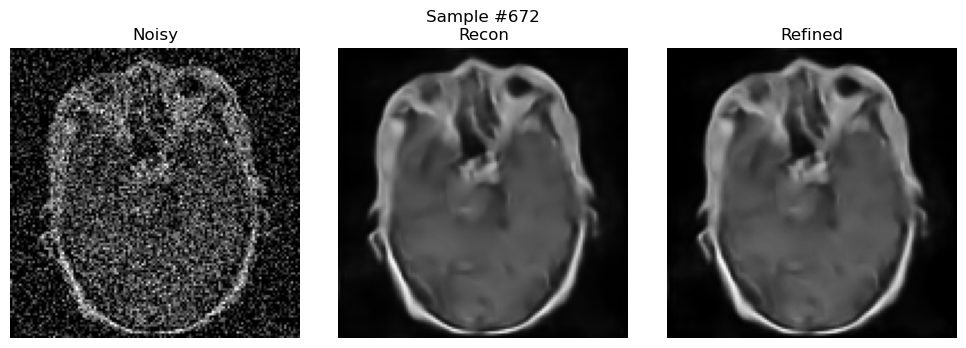

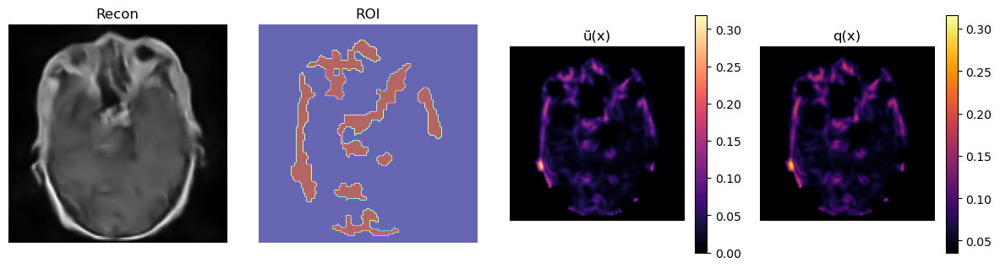

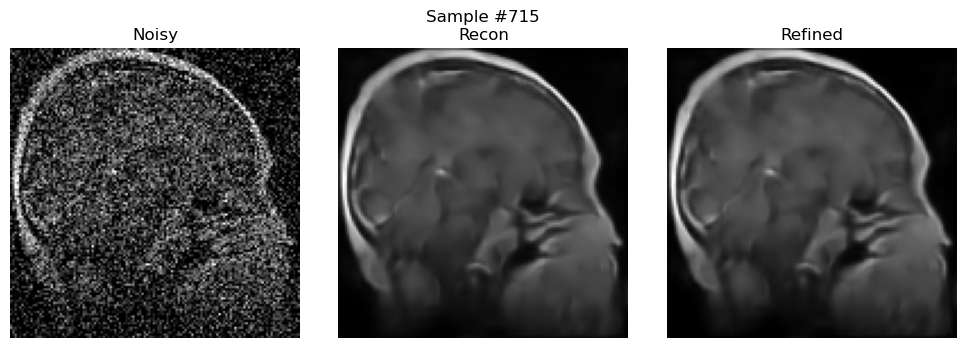

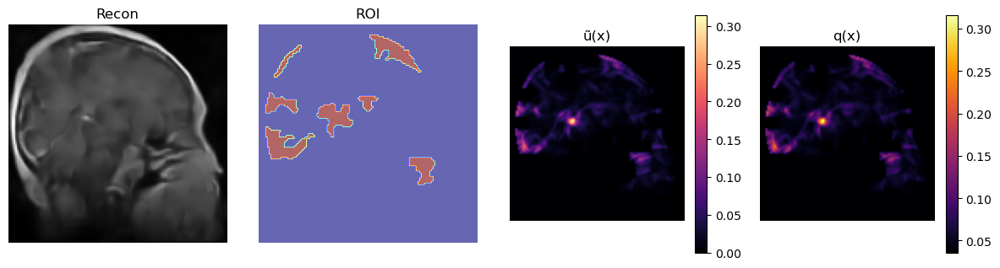

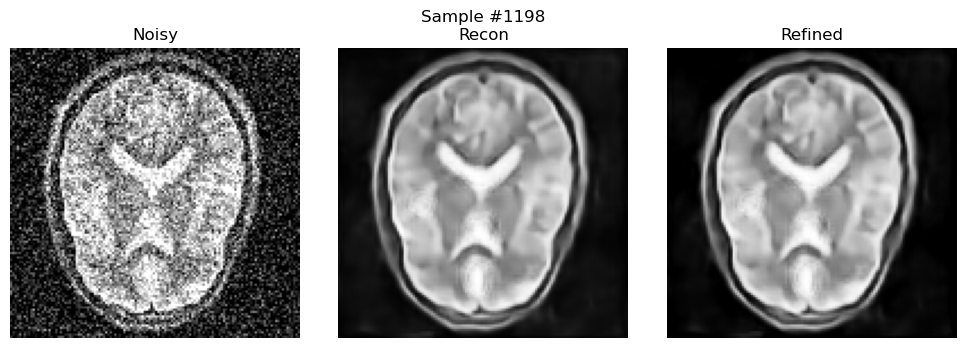

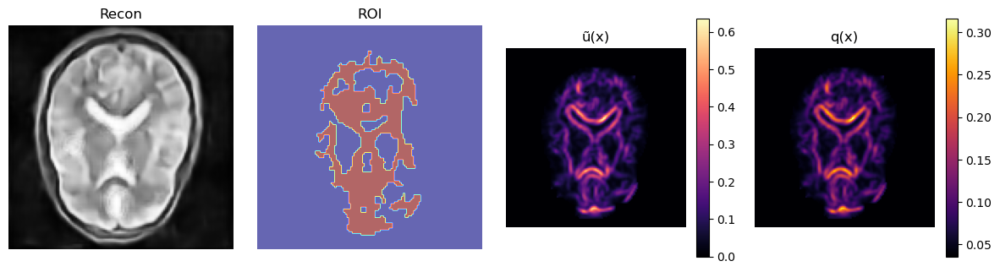

In [65]:
# --- שלב 2: הוספת רעש (רק לסימולציה) ---
noise_factor = 0.2
x_test_noisy = images + noise_factor * np.random.normal(0.0, 1.0, size=images.shape)
x_test_noisy = np.clip(x_test_noisy, 0.0, 1.0)

print(f"[TEST] Noisy input ready: {x_test_noisy.shape}")

# --- שלב 3: שחזור בעזרת ה־Autoencoder ---
recons = autoencoder.predict(x_test_noisy, verbose=1)
recons = recons[..., 0]   # (N, H, W)

print(f"[TEST] Reconstructions: {recons.shape}")

# --- שלב 4: בניית מפות חוסר ודאות ו־ROI לכל תמונה ---
lam, beta, u0 = best['lam'], best['beta'], best['u0']

refined_list, qpix_list, roi_list, utilde_list = [], [], [], []

for i in range(len(recons)):
    recon = recons[i]
    noisy = x_test_noisy[i, ..., 0]

    # יצירת ROI ו־ũ(x)
    u_tilde, roi, _ = build_roi_valholdout(recon, use_laplace=True, threshold='otsu',
                                           min_size_ratio=0.0025, smooth_sigma=0.75)
    u_norm = _normalize_safe(u_tilde)
    q_pix  = lam * (u0 + beta * u_norm)

    # בניית קלט לרשת המשופרת
    X_in = stack_inputs_for_refine(recon, noisy, u_tilde, roi, q_pix=q_pix)
    refined = refine_net.predict(X_in[np.newaxis, ...], verbose=0)[0, ..., 0]

    # נירמול ויזואלי לשם צפייה
    refined_vis = match_mean_std(refined, recon, mask=roi.astype(bool))

    refined_list.append(refined_vis)
    qpix_list.append(q_pix)
    roi_list.append(roi)
    utilde_list.append(u_tilde)

print(f"[TEST] Refined results ready: {len(refined_list)} images")

# --- שלב 5: הדמיה של דוגמאות ---
def show_triptych(noisy, recon, refined, title="Noisy | Recon | Refined"):
    plt.figure(figsize=(10,3.5))
    plt.subplot(1,3,1); plt.imshow(noisy,   cmap='gray'); plt.title("Noisy");   plt.axis('off')
    plt.subplot(1,3,2); plt.imshow(recon,   cmap='gray'); plt.title("Recon");   plt.axis('off')
    plt.subplot(1,3,3); plt.imshow(refined, cmap='gray'); plt.title("Refined"); plt.axis('off')
    plt.suptitle(title); plt.tight_layout(); plt.show()

def show_maps(recon, roi, u_tilde, q_pix):
    plt.figure(figsize=(12,3.2))
    plt.subplot(1,4,1); plt.imshow(recon, cmap='gray'); plt.title("Recon"); plt.axis('off')
    plt.subplot(1,4,2); plt.imshow(roi, cmap='jet', alpha=0.6); plt.title("ROI"); plt.axis('off')
    plt.subplot(1,4,3); plt.imshow(u_tilde, cmap='magma'); plt.title("ũ(x)"); plt.colorbar(); plt.axis('off')
    plt.subplot(1,4,4); plt.imshow(q_pix, cmap='inferno'); plt.title("q(x)"); plt.colorbar(); plt.axis('off')
    plt.tight_layout(); plt.show()

# הצגה של כמה דוגמאות אקראיות
idxs = np.random.choice(len(recons), size=min(3, len(recons)), replace=False)
for i in idxs:
    show_triptych(x_test_noisy[i, ..., 0], recons[i], refined_list[i], title=f"Sample #{i}")
    show_maps(recons[i], roi_list[i], utilde_list[i], qpix_list[i])

In [66]:
import numpy as np
import matplotlib.pyplot as plt

def analyze_refinement(clean, recon, refined, roi, q_pix):
    """
    מציג את ההבדלים, השאריות והפיקסלים שבהם עדיין יש חוסר כיסוי.
    clean יכול להיות None אם אין אמת קרקע (רק הדמיה).
    """
    T_lo, T_hi = recon - q_pix, recon + q_pix
    cover = ((clean >= T_lo) & (clean <= T_hi)) if clean is not None else None

    # שאריות
    diff_recon   = np.abs(clean - recon) if clean is not None else np.zeros_like(recon)
    diff_refined = np.abs(clean - refined) if clean is not None else np.zeros_like(refined)
    delta = np.abs(refined - recon)

    # misses (ROI שלא כוסה)
    miss_map = np.zeros_like(roi, dtype=np.uint8)
    if cover is not None:
        miss_map[(roi == 1) & (~cover)] = 1

    # ציור
    fig, axes = plt.subplots(2, 3, figsize=(14, 8))

    axes[0,0].imshow(recon, cmap='gray'); axes[0,0].set_title("Recon"); axes[0,0].axis('off')
    axes[0,1].imshow(refined, cmap='gray'); axes[0,1].set_title("Refined"); axes[0,1].axis('off')
    axes[0,2].imshow(delta, cmap='coolwarm'); axes[0,2].set_title("|Refined - Recon|"); axes[0,2].axis('off')

    if clean is not None:
        axes[1,0].imshow(diff_recon, cmap='inferno'); axes[1,0].set_title("|Clean - Recon|"); axes[1,0].axis('off')
        axes[1,1].imshow(diff_refined, cmap='inferno'); axes[1,1].set_title("|Clean - Refined|"); axes[1,1].axis('off')
    else:
        axes[1,0].imshow(roi, cmap='jet', alpha=0.6); axes[1,0].set_title("ROI"); axes[1,0].axis('off')
        axes[1,1].imshow(q_pix, cmap='magma'); axes[1,1].set_title("q(x)"); axes[1,1].axis('off')

    axes[1,2].imshow(recon, cmap='gray')
    axes[1,2].imshow(miss_map, alpha=0.5, cmap='Reds')
    axes[1,2].set_title("Misses (red in ROI)"); axes[1,2].axis('off')

    plt.tight_layout(); plt.show()

    # מדדים כמותיים (אם יש clean)
    if clean is not None:
        psnr_recon = -10 * np.log10(np.mean((clean - recon)**2) + 1e-8)
        psnr_refined = -10 * np.log10(np.mean((clean - refined)**2) + 1e-8)
        improvement = psnr_refined - psnr_recon
        print(f"ΔPSNR = {improvement:.3f} dB  |  {psnr_refined:.2f} vs {psnr_recon:.2f}")


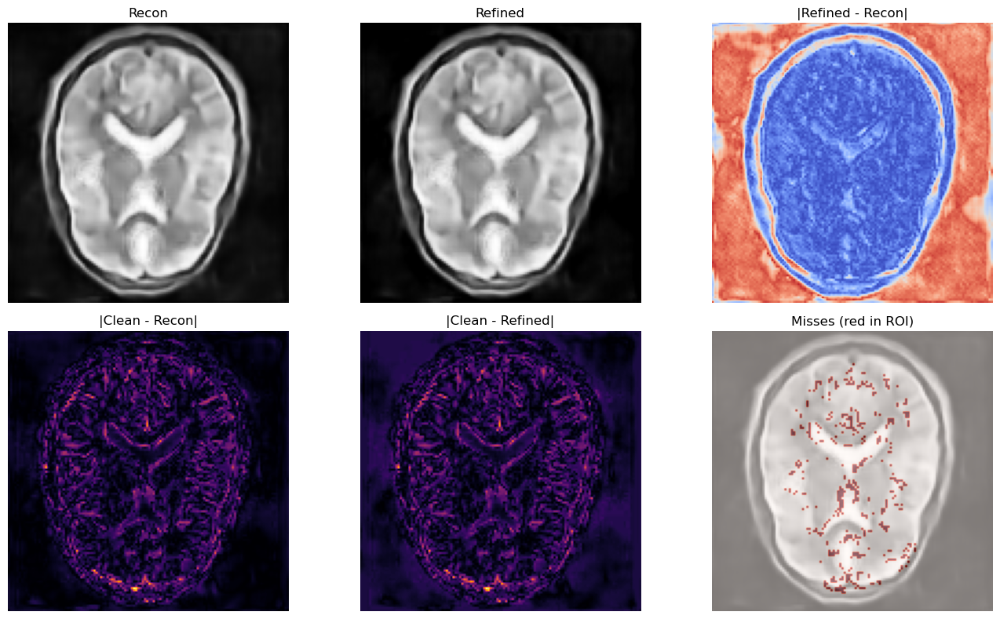

ΔPSNR = -0.856 dB  |  21.91 vs 22.77


In [67]:
# נבחר אינדקס לבדיקה
i = 1198

# טוענים את המרכיבים הרלוונטיים
recon   = recons[i]                 # שחזור מה-AE
refined = refined_list[i]           # תוצאה מהרשת המשופרת
roi     = roi_list[i]               # מסכת ROI
q_pix   = qpix_list[i]              # רוחב אינטרוול RCPS

# אם יש לך גם תמונה "נקייה" (Clean) — תכניס כאן:
clean = images[i, ..., 0]  # (לא חובה, רק אם קיים ground truth)

# מפעילים את הניתוח
analyze_refinement(clean, recon, refined, roi, q_pix)


In [9]:
# ===== Imports =====
import os, json, warnings
import numpy as np
import cv2

from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_objects
from scipy.ndimage import binary_closing, gaussian_filter

# ===== Utilities =====
def normalize(img, eps=1e-8):
    img = img.astype(np.float32)
    mn, mx = np.min(img), np.max(img)
    return (img - mn) / (mx - mn + eps)

def sobel_gradient(img):
    # img: (H, W) float32 [0,1]
    sobelx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)
    sobely = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)
    g = np.sqrt(sobelx**2 + sobely**2)
    return normalize(g)

def laplacian_map(img):
    lap = cv2.Laplacian(img.astype(np.float32), cv2.CV_32F, ksize=3)
    return normalize(np.abs(lap))

def postprocess_mask(mask, min_size=50, do_close=True, close_iter=1):
    # mask: binary uint8 {0,1}
    mask = (mask > 0).astype(np.uint8)
    if do_close:
        for _ in range(close_iter):
            mask = binary_closing(mask, structure=np.ones((3, 3))).astype(np.uint8)
    if min_size is not None and min_size > 0:
        mask = remove_small_objects(mask.astype(bool), min_size=min_size).astype(np.uint8)
    return mask

def fused_u(residual_norm, gradient_norm, alpha=0.5, smooth_sigma=0.0):
    """u~ = alpha*residual + (1-alpha)*gradient (optionally smooth)"""
    u = alpha * residual_norm + (1.0 - alpha) * gradient_norm
    u = normalize(u)
    if smooth_sigma and smooth_sigma > 0:
        u = gaussian_filter(u, sigma=smooth_sigma)
        u = normalize(u)
    return u

def build_roi_from_map(u_map, threshold='otsu', min_size=50, do_close=True):
    if threshold == 'otsu':
        thr = threshold_otsu(u_map)
    elif isinstance(threshold, float):
        thr = threshold
    else:
        thr = 0.5
    roi = (u_map > thr).astype(np.uint8)
    roi = postprocess_mask(roi, min_size=min_size, do_close=do_close)
    return roi


In [10]:
# ===== ROI builders (Calib/Test) =====
def build_roi_calib(clean_img, recon_img,
                    use_laplace=False, fuse_alpha=0.5,
                    threshold='otsu', min_size_ratio=0.0025, smooth_sigma=0.0):
    """
    ב-Calib מותר clean: gradient על clean, residual על clean-recon, fuse -> ROI
    """
    H, W = clean_img.shape
    min_size = max(1, int(min_size_ratio * H * W))

    residual = np.abs(clean_img - recon_img).astype(np.float32)
    residual_norm = normalize(residual)

    grad = sobel_gradient(clean_img)
    if use_laplace:
        lap = laplacian_map(clean_img)
        grad = normalize(0.7 * grad + 0.3 * lap)

    u_tilde = fused_u(residual_norm, grad, alpha=fuse_alpha, smooth_sigma=smooth_sigma)
    roi = build_roi_from_map(u_tilde, threshold=threshold, min_size=min_size, do_close=True)

    # Fallback אם ROI ריק: נוריד את הסף ל-75 אחוזון
    if roi.sum() == 0:
        thr = np.quantile(u_tilde, 0.75)
        roi = (u_tilde > thr).astype(np.uint8)
        roi = postprocess_mask(roi, min_size=min_size, do_close=True)
    return u_tilde, roi

def build_roi_test(recon_img,
                   use_laplace=True, threshold='otsu',
                   min_size_ratio=0.0025, smooth_sigma=0.0):
    """
    ב-Test אין clean: בונים u_tilde מהשחזורים בלבד (gradient/Laplacian על recon)
    """
    H, W = recon_img.shape
    min_size = max(1, int(min_size_ratio * H * W))

    grad = sobel_gradient(recon_img)
    if use_laplace:
        lap = laplacian_map(recon_img)
        u_tilde = normalize(0.7 * grad + 0.3 * lap)
    else:
        u_tilde = grad

    if smooth_sigma and smooth_sigma > 0:
        u_tilde = gaussian_filter(u_tilde, sigma=smooth_sigma)
        u_tilde = normalize(u_tilde)

    roi = build_roi_from_map(u_tilde, threshold=threshold, min_size=min_size, do_close=True)

    # Fallback אם ROI ריק: נוריד לסף 75%
    if roi.sum() == 0:
        thr = np.quantile(u_tilde, 0.75)
        roi = (u_tilde > thr).astype(np.uint8)
        roi = postprocess_mask(roi, min_size=min_size, do_close=True)
    return u_tilde, roi

In [11]:
# ===== RCPS-Q_ROI: כיול סקלרי q על ROI =====
def compute_conformal_q_from_pool(residuals_pool, alpha=0.1):
    """
    קונפורמלי בדיסקרטי: k = ceil((N+1)*(1-alpha)) -> סדר סטטיסטי שמבטיח כיסוי ≥ 1-alpha
    """
    residuals_pool = np.asarray(residuals_pool, dtype=np.float32).ravel()
    N = residuals_pool.size
    if N == 0:
        raise ValueError("Empty residual pool for Q_ROI calibration.")
    k = int(np.ceil((N + 1) * (1 - alpha)))  # 1-indexed
    k = np.clip(k, 1, N)                      # בגבולות
    # בחירה ללא מיון מלא
    q = np.partition(residuals_pool, k - 1)[k - 1]
    return float(q)

def make_calib_items_QROI(x_calib, x_calib_noisy, autoencoder,
                          fuse_alpha=0.5, use_laplace=False,
                          threshold='otsu', min_size_ratio=0.0025, smooth_sigma=0.0,
                          verbose=0):
    """
    מכין אייטמים לכיול Q_ROI: לכל תמונה מחשבים recon, u_tilde, ROI, ומחזירים residuals@ROI
    מחזיר: residuals_pool (וקטור), artifacts (לבדיקות/ויזואליזציה)
    """
    residuals_pool = []
    artifacts = []  # אופציונלי: לשמירת ROI/u לדגימה
    for i in range(len(x_calib)):
        clean = x_calib[i].squeeze().astype(np.float32)
        noisy = x_calib_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        u_tilde, roi = build_roi_calib(clean, recon,
                                       use_laplace=use_laplace,
                                       fuse_alpha=fuse_alpha,
                                       threshold=threshold,
                                       min_size_ratio=min_size_ratio,
                                       smooth_sigma=smooth_sigma)
        residual = np.abs(clean - recon).astype(np.float32)
        r_roi = residual[roi == 1]
        if r_roi.size > 0:
            residuals_pool.append(r_roi)
        else:
            if verbose:
                print(f"[Q_ROI] Warning: empty ROI at calib idx={i}, skipped.")
        artifacts.append({'u_tilde': u_tilde, 'roi': roi})
    if len(residuals_pool) == 0:
        raise RuntimeError("No ROI pixels in calibration. Adjust thresholds/min_size.")
    residuals_pool = np.concatenate(residuals_pool, axis=0)
    return residuals_pool, artifacts

def calibrate_QROI(x_calib, x_calib_noisy, autoencoder,
                   alpha=0.1,
                   fuse_alpha=0.5, use_laplace=False,
                   threshold='otsu', min_size_ratio=0.0025, smooth_sigma=0.0,
                   save_dir=None, verbose=0):
    """
    צינור מלא לכיול Q_ROI: בונה מאגר שאריות ב-ROI ומחשב q_hat קונפורמלי.
    """
    residuals_pool, artifacts = make_calib_items_QROI(
        x_calib, x_calib_noisy, autoencoder,
        fuse_alpha=fuse_alpha, use_laplace=use_laplace,
        threshold=threshold, min_size_ratio=min_size_ratio,
        smooth_sigma=smooth_sigma, verbose=verbose
    )
    q_hat = compute_conformal_q_from_pool(residuals_pool, alpha=alpha)

    stats = {
        'alpha': float(alpha),
        'N_pool': int(residuals_pool.size),
        'mean_resid_roi': float(np.mean(residuals_pool)),
        'median_resid_roi': float(np.median(residuals_pool)),
        'q_hat': float(q_hat),
        'fuse_alpha': float(fuse_alpha),
        'use_laplace': bool(use_laplace),
        'threshold': str(threshold),
        'min_size_ratio': float(min_size_ratio),
        'smooth_sigma': float(smooth_sigma),
    }
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
        np.savez_compressed(os.path.join(save_dir, "qroi_calib_pool.npz"),
                            residuals_pool=residuals_pool)
        with open(os.path.join(save_dir, "qroi_stats.json"), "w", encoding="utf-8") as f:
            json.dump(stats, f, ensure_ascii=False, indent=2)
    if verbose:
        print(f"[Q_ROI] alpha={alpha:.2f}, N={stats['N_pool']}, q_hat={q_hat:.4f}")
    return q_hat, stats, artifacts

# ===== החלת Q_ROI בטסט =====
def apply_QROI_on_test(noisy_img, autoencoder, q_hat,
                       roi_threshold='otsu', use_laplace=True,
                       min_size_ratio=0.0025, smooth_sigma=0.0):
    """
    בונה ROI על בסיס recon בלבד, ומחיל אינטרוול בגובה q_hat על הפיקסלים בתוך ה-ROI.
    מחזיר: recon, T_lo, T_hi, interval_map, roi, u_tilde
    """
    recon = autoencoder.predict(noisy_img[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)
    u_tilde, roi = build_roi_test(recon,
                                  use_laplace=use_laplace,
                                  threshold=roi_threshold,
                                  min_size_ratio=min_size_ratio,
                                  smooth_sigma=smooth_sigma)
    T_lo = recon - q_hat
    T_hi = recon + q_hat
    interval_map = (T_hi - T_lo).astype(np.float32)
    interval_map[roi == 0] = 0.0
    return recon, T_lo, T_hi, interval_map, roi, u_tilde

# ===== הערכת ביצועים (לא לפרודקשן — רק לאוולואציה כשיש clean) =====
def evaluate_coverage_QROI(clean_img, T_lo, T_hi, roi):
    roi_bool = (roi == 1)
    n = int(roi_bool.sum())
    if n == 0:
        return {'coverage': None, 'avg_width': 0.0, 'n_roi': 0}
    cover = ((clean_img >= T_lo) & (clean_img <= T_hi))
    coverage = float(cover[roi_bool].mean())
    avg_width = float((T_hi - T_lo)[roi_bool].mean())
    return {'coverage': coverage, 'avg_width': avg_width, 'n_roi': n}

In [12]:
from sklearn.model_selection import train_test_split

# נניח שכבר יש לך x_val, x_val_noisy, y_val
# ואתה רוצה לעבוד רק על תמונות עם גידול (label=1):

tumor_idxs = np.where(y_val == 1)[0]
x_val_tumor = x_val[tumor_idxs]
x_val_noisy_tumor = x_val_noisy[tumor_idxs]

# חלוקה ל-Calib/Test
x_calib, x_test, x_calib_noisy, x_test_noisy = train_test_split(
    x_val_tumor, x_val_noisy_tumor,
    test_size=0.3, random_state=42
)

print("Calibration set size:", x_calib.shape)
print("Test set size:", x_test.shape)


Calibration set size: (576, 128, 128, 1)
Test set size: (248, 128, 128, 1)


[Q_ROI] alpha=0.10, N=2273470, q_hat=0.1439
[Q_ROI Eval] coverage=0.914 | avg_width=0.2878 | n_roi=2285


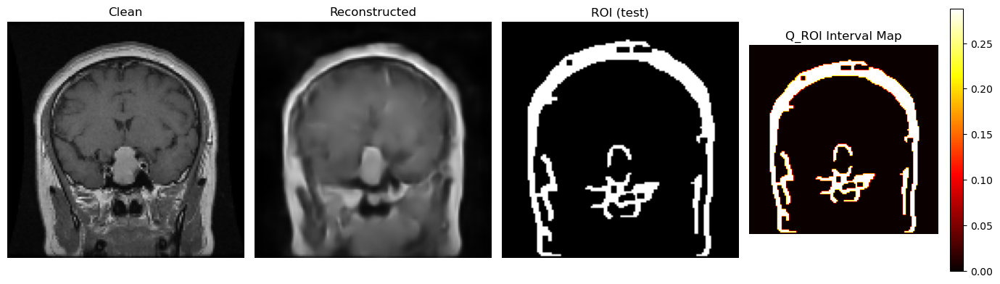

In [13]:
# === שלב כיול Q_ROI על x_calib ===
q_hat, q_stats, _ = calibrate_QROI(
    x_calib, x_calib_noisy, autoencoder,
    alpha=0.1,            # יעד כיסוי 90%
    fuse_alpha=0.5,       # שקלול residual/gradient ב-Calib
    use_laplace=False,    # ב-Calib בד"כ לא חובה
    threshold='otsu',
    min_size_ratio=0.0025,# ~0.25% מהפיקסלים כמינימום רכיב
    smooth_sigma=0.5,     # החלקה קלה ל-u
    save_dir=None,
    verbose=1
)

# === שלב החלה ב-Test לדוגמה בודדת ===
idx = np.random.randint(0, len(x_test))
clean_img = x_test[idx].squeeze().astype(np.float32)
noisy_img = x_test_noisy[idx].squeeze().astype(np.float32)

recon_img, T_lo, T_hi, interval_map, roi_test, u_tilde_test = apply_QROI_on_test(
    noisy_img, autoencoder, q_hat,
    roi_threshold='otsu',
    use_laplace=True,         # ב-Test נוח לשלב Laplacian כדי לחזק גבולות חלשים
    min_size_ratio=0.0025,
    smooth_sigma=0.5
)

# === הערכת כיסוי (מותרת כאן כי יש לנו clean לצורך ניסוי) ===
eval_metrics = evaluate_coverage_QROI(clean_img, T_lo, T_hi, roi_test)
print("[Q_ROI Eval] coverage=%.3f | avg_width=%.4f | n_roi=%d" %
      (eval_metrics['coverage'], eval_metrics['avg_width'], eval_metrics['n_roi']))

# === הדמיות (אופציונלי) ===
import matplotlib.pyplot as plt
plt.figure(figsize=(14,4))
plt.subplot(1,4,1); plt.imshow(clean_img, cmap='gray'); plt.title("Clean"); plt.axis('off')
plt.subplot(1,4,2); plt.imshow(recon_img, cmap='gray'); plt.title("Reconstructed"); plt.axis('off')
plt.subplot(1,4,3); plt.imshow(roi_test, cmap='gray'); plt.title("ROI (test)"); plt.axis('off')
plt.subplot(1,4,4); plt.imshow(interval_map, cmap='hot'); plt.title("Q_ROI Interval Map"); plt.colorbar(); plt.axis('off')
plt.tight_layout(); plt.show()

In [14]:
import matplotlib.pyplot as plt

def visualize_calib_rois(calib_items, n=5, random=True):
    """
    מציג n דוגמאות מתוך calib_items עם Clean, Recon, ROI Overlay, u_tilde.
    calib_items = [(Y, Yhat, u_tilde, roi), ...]
    """
    if random:
        idxs = np.random.choice(len(calib_items), n, replace=False)
    else:
        idxs = np.arange(min(n, len(calib_items)))

    plt.figure(figsize=(12, 3*n))
    for i, idx in enumerate(idxs):
        clean, recon, u_tilde, roi = calib_items[idx]

        # Clean
        plt.subplot(n, 4, i*4 + 1)
        plt.imshow(clean, cmap='gray')
        plt.title("Clean")
        plt.axis("off")

        # Reconstructed
        plt.subplot(n, 4, i*4 + 2)
        plt.imshow(recon, cmap='gray')
        plt.title("Reconstructed")
        plt.axis("off")

        # ROI overlay
        plt.subplot(n, 4, i*4 + 3)
        plt.imshow(recon, cmap='gray')
        plt.imshow(roi, cmap='jet', alpha=0.4)
        plt.title("ROI Overlay")
        plt.axis("off")

        # u_tilde (heatmap)
        plt.subplot(n, 4, i*4 + 4)
        plt.imshow(u_tilde, cmap='hot')
        plt.title("u_tilde (Residual+Grad)")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


In [15]:
def make_calib_items_adaptive(x_calib, x_calib_noisy, autoencoder,
                              fuse_alpha=0.5, use_laplace=False,
                              threshold='otsu', min_size_ratio=0.0025,
                              verbose=1):
    items = []
    empty = 0
    for i in range(len(x_calib)):
        clean = x_calib[i].squeeze().astype(np.float32)
        noisy = x_calib_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        u_tilde, roi = build_roi_calib(clean, recon,
                                       fuse_alpha=fuse_alpha,
                                       use_laplace=use_laplace,
                                       threshold=threshold,
                                       min_size_ratio=min_size_ratio)
        if roi.sum() == 0:
            empty += 1
        items.append((clean, recon, u_tilde, roi))

    if verbose:
        print(f"[CALIB] Built {len(items)} items | Empty ROI: {empty}")
    return items

[CALIB] Built 576 items | Empty ROI: 0


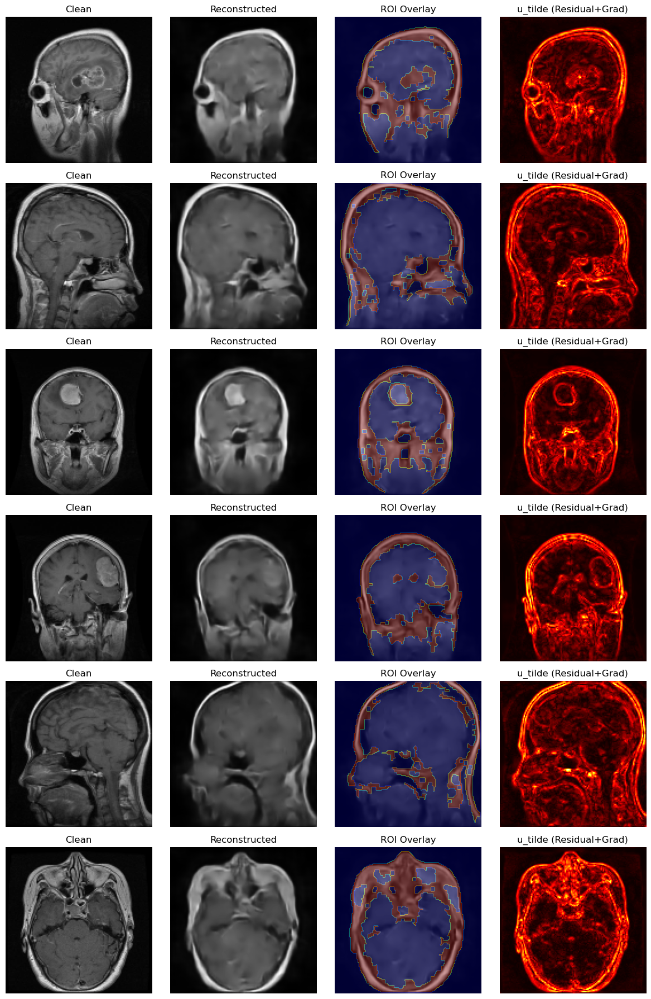

In [16]:
calib_items = make_calib_items_adaptive(
    x_calib, x_calib_noisy, autoencoder,
    fuse_alpha=0.5, use_laplace=False,
    threshold='otsu', min_size_ratio=0.0025,
    verbose=1
)

visualize_calib_rois(calib_items, n=6, random=True)


Q_ROI q_hat=0.1458, pool size=2172495


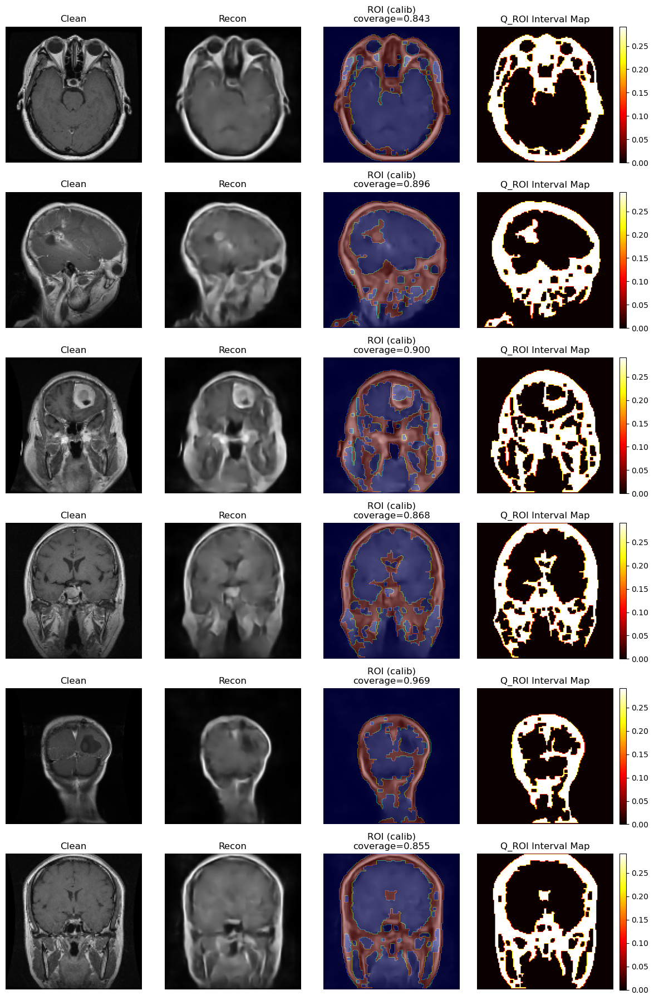

In [17]:
# === Q_ROI: חישוב q_hat על הכיול ===
def compute_qroi_from_pool(residuals_pool, alpha=0.1):
    r = np.asarray(residuals_pool, dtype=np.float32).ravel()
    N = r.size; assert N>0, "No residuals in pool."
    k = int(np.ceil((N+1)*(1-alpha))); k = np.clip(k, 1, N)
    return float(np.partition(r, k-1)[k-1])

def collect_residuals_pool_from_calib(calib_items):
    # calib_items = [(Y, Yhat, u_tilde, roi), ...]
    pool = []
    for (Y, Yhat, u, roi) in calib_items:
        residual = np.abs(Y - Yhat)
        pool.append(residual[roi==1])
    return np.concatenate(pool, axis=0)

residuals_pool = collect_residuals_pool_from_calib(calib_items)
q_hat = compute_qroi_from_pool(residuals_pool, alpha=0.1)
print(f"Q_ROI q_hat={q_hat:.4f}, pool size={residuals_pool.size}")

# === ויזואליזציה על תמונות הכיול ===
import matplotlib.pyplot as plt

def show_cp_on_calib(calib_items, q_hat, n=6, random=True):
    idxs = np.random.choice(len(calib_items), n, replace=False) if random else np.arange(min(n, len(calib_items)))
    plt.figure(figsize=(12, 3*n))
    for r, idx in enumerate(idxs):
        Y, Yhat, u, roi = calib_items[idx]
        T_lo, T_hi = Yhat - q_hat, Yhat + q_hat
        interval_map = (T_hi - T_lo).astype(np.float32)
        interval_map[roi==0] = 0.0
        cover = ((Y >= T_lo) & (Y <= T_hi))
        cov_roi = cover[roi==1].mean() if roi.sum()>0 else np.nan

        plt.subplot(n,4,4*r+1); plt.imshow(Y, cmap='gray'); plt.title("Clean"); plt.axis('off')
        plt.subplot(n,4,4*r+2); plt.imshow(Yhat, cmap='gray'); plt.title("Recon"); plt.axis('off')
        plt.subplot(n,4,4*r+3); plt.imshow(Yhat, cmap='gray'); plt.imshow(roi, cmap='jet', alpha=0.4)
        plt.title(f"ROI (calib)\ncoverage={cov_roi:.3f}"); plt.axis('off')
        plt.subplot(n,4,4*r+4); im=plt.imshow(interval_map, cmap='hot'); plt.title("Q_ROI Interval Map"); plt.axis('off'); plt.colorbar(im, fraction=0.046, pad=0.04)
    plt.tight_layout(); plt.show()

show_cp_on_calib(calib_items, q_hat, n=6, random=True)


In [18]:
# ========= NEW: Brain mask מהיר (10 שורות) =========
import cv2
import numpy as np
from skimage.morphology import remove_small_objects
from scipy.ndimage import binary_closing, binary_opening, binary_erosion, distance_transform_edt

def brain_mask_quick(img, erode_px=6):
    """
    Brain mask מהיר על בסיס סף אוטומטי+רכיב מחובר עיקרי+ארוזיה.
    img: 2D float [0,1] (clean או recon)
    """
    x = (img*255).astype(np.uint8)
    # Otsu (או Percentile אם יש רקע דומיננטי)
    thr, _ = cv2.threshold(x, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    m = (x > thr).astype(np.uint8)
    # הסרת חורים קטנים וניקוי
    m = binary_closing(m, structure=np.ones((3,3))).astype(np.uint8)
    m = remove_small_objects(m.astype(bool), min_size=int(0.0025*m.size)).astype(np.uint8)
    # רכיב מחובר עיקרי (הגדול ביותר)
    # (טריק: erode מעט ואז open לשחרור “חוטים” דקים)
    if m.sum() > 0:
        # ארוזיה קלה מהשוליים כדי לא לכלוא קצוות גולגולת
        if erode_px > 0:
            m = binary_erosion(m, structure=np.ones((erode_px, erode_px))).astype(np.uint8)
        m = binary_opening(m, structure=np.ones((3,3))).astype(np.uint8)
        m = remove_small_objects(m.astype(bool), min_size=int(0.01*m.size)).astype(np.uint8)
    return m


In [19]:
# ========= CHANGED: build_roi_calib עם brain_mask =========
from skimage.filters import threshold_otsu
from scipy.ndimage import gaussian_filter

def normalize(img, eps=1e-8):
    img = img.astype(np.float32); mn, mx = img.min(), img.max()
    return (img - mn) / (mx - mn + eps)

def sobel_gradient(img):
    gx = cv2.Sobel(img.astype(np.float32), cv2.CV_32F, 1, 0, 3)
    gy = cv2.Sobel(img.astype(np.float32), cv2.CV_32F, 0, 1, 3)
    return normalize(np.sqrt(gx*gx + gy*gy))

def laplacian_map(img):
    lap = cv2.Laplacian(img.astype(np.float32), cv2.CV_32F, 3)
    return normalize(np.abs(lap))

def postprocess_mask(mask, min_size=50, do_close=True):
    m = (mask>0).astype(np.uint8)
    if do_close:
        m = binary_closing(m, structure=np.ones((3,3))).astype(np.uint8)
    m = remove_small_objects(m.astype(bool), min_size=min_size).astype(np.uint8)
    return m

def fused_u(residual_norm, gradient_norm, alpha=0.7, smooth_sigma=0.75):  # CHANGED defaults
    u = alpha * residual_norm + (1 - alpha) * gradient_norm
    if smooth_sigma and smooth_sigma > 0:
        u = gaussian_filter(u.astype(np.float32), sigma=float(smooth_sigma))
    return normalize(u)

def build_roi_from_map(u_map, threshold='otsu', min_size=50, do_close=True):
    thr = threshold_otsu(u_map) if threshold=='otsu' else float(threshold)
    roi = (u_map > thr).astype(np.uint8)
    roi = postprocess_mask(roi, min_size=min_size, do_close=do_close)
    return roi

def build_roi_calib(clean_img, recon_img,
                    fuse_alpha=0.7,        # CHANGED default
                    use_laplace=False,
                    threshold='otsu',
                    min_size_ratio=0.0025,
                    smooth_sigma=0.75):    # CHANGED default
    H, W = clean_img.shape
    min_size = max(1, int(min_size_ratio * H * W))

    # NEW: brain mask מהclean (זמין ב-Calib)
    bm = brain_mask_quick(clean_img, erode_px=6)

    residual_norm = normalize(np.abs(clean_img - recon_img))
    grad = sobel_gradient(clean_img)
    if use_laplace:
        grad = normalize(0.7*grad + 0.3*laplacian_map(clean_img))

    u_tilde = fused_u(residual_norm, grad, alpha=fuse_alpha, smooth_sigma=smooth_sigma)

    # NEW: מדכאים u_tilde מחוץ למוח + דיסטנס מהשוליים כדי להקטין משיכת קצה
    dist = distance_transform_edt(bm)  # מרחק מהשפה פנימה
    edge_suppress = np.clip(dist / 8.0, 0, 1).astype(np.float32)  # τ≈8px
    u_tilde = u_tilde * edge_suppress * bm  # רק בתוך המוח, ומדוכא בקצה

    roi = build_roi_from_map(u_tilde, threshold=threshold, min_size=min_size, do_close=True)
    if roi.sum()==0:  # fallback
        thr = np.quantile(u_tilde[bm==1], 0.70) if bm.sum()>0 else np.quantile(u_tilde, 0.75)
        roi = (u_tilde > thr).astype(np.uint8)
        roi = postprocess_mask(roi, min_size=min_size, do_close=True)
    return u_tilde, roi, bm   # מחזירים גם brain mask (QA)


In [20]:
# ========= CHANGED: build_roi_test עם brain_mask =========
def build_roi_test(recon_img,
                   use_laplace=True,
                   threshold='otsu',
                   min_size_ratio=0.0025,
                   smooth_sigma=0.75):     # CHANGED default
    H, W = recon_img.shape
    min_size = max(1, int(min_size_ratio * H * W))

    # NEW: brain mask על בסיס recon
    bm = brain_mask_quick(recon_img, erode_px=6)

    grad = sobel_gradient(recon_img)
    if use_laplace:
        grad = normalize(0.7*grad + 0.3*laplacian_map(recon_img))

    # u רק בתוך המוח + דיכוי קצה
    u_tilde = fused_u(residual_norm=np.zeros_like(grad), gradient_norm=grad,  # רק גרדיאנט בטסט
                      alpha=0.0, smooth_sigma=smooth_sigma)
    dist = distance_transform_edt(bm)
    edge_suppress = np.clip(dist / 8.0, 0, 1).astype(np.float32)
    u_tilde = u_tilde * edge_suppress * bm

    roi = build_roi_from_map(u_tilde, threshold=threshold, min_size=min_size, do_close=True)
    if roi.sum()==0:
        thr = np.quantile(u_tilde[bm==1], 0.70) if bm.sum()>0 else np.quantile(u_tilde, 0.75)
        roi = (u_tilde > thr).astype(np.uint8)
        roi = postprocess_mask(roi, min_size=min_size, do_close=True)
    return u_tilde, roi, bm


In [21]:
# ========= CHANGED: יצירת calib_items עם brain_mask + פרמטרים החדשים =========
def make_calib_items_adaptive(x_calib, x_calib_noisy, autoencoder,
                              fuse_alpha=0.7, use_laplace=False,
                              threshold='otsu', min_size_ratio=0.0025,
                              smooth_sigma=0.75, verbose=1):
    items, empty = [], 0
    for i in range(len(x_calib)):
        Y = x_calib[i].squeeze().astype(np.float32)
        N = x_calib_noisy[i].squeeze().astype(np.float32)
        Yhat = autoencoder.predict(N[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)
        u_tilde, roi, bm = build_roi_calib(Y, Yhat,
                                           fuse_alpha=fuse_alpha, use_laplace=use_laplace,
                                           threshold=threshold, min_size_ratio=min_size_ratio,
                                           smooth_sigma=smooth_sigma)
        if roi.sum()==0: empty += 1
        items.append((Y, Yhat, u_tilde, roi, bm))  # שומרים גם brain mask ל-QA
    if verbose:
        print(f"[CALIB] Built {len(items)} items | Empty ROI: {empty}")
    return items

def collect_residuals_pool_from_calib(calib_items):
    pool = []
    for (Y, Yhat, u, roi, bm) in calib_items:
        r = np.abs(Y - Yhat)
        pool.append(r[roi==1])
    return np.concatenate(pool, axis=0)

def compute_qroi_from_pool(residuals_pool, alpha=0.1):
    r = np.asarray(residuals_pool, dtype=np.float32).ravel()
    N = r.size; assert N>0, "Empty residuals pool."
    k = int(np.ceil((N+1)*(1-alpha))); k = np.clip(k, 1, N)
    return float(np.partition(r, k-1)[k-1])

def evaluate_coverage_on_calib(calib_items, q_hat):
    covs, ns = [], []
    for (Y, Yhat, u, roi, bm) in calib_items:
        T_lo, T_hi = Yhat - q_hat, Yhat + q_hat
        cover = ((Y >= T_lo) & (Y <= T_hi))
        n = int(roi.sum())
        if n>0:
            covs.append(cover[roi==1].mean())
            ns.append(n)
    covs = np.array(covs); ns = np.array(ns)
    print(f"[Q_ROI Calib] mean_coverage={covs.mean():.3f} ± {covs.std():.3f} over {len(covs)} images | "
          f"median_roi_px={np.median(ns):.0f}")
    return covs, ns

# ===== הרצה =====
calib_items = make_calib_items_adaptive(
    x_calib, x_calib_noisy, autoencoder,
    fuse_alpha=0.7, use_laplace=False,
    threshold='otsu', min_size_ratio=0.0025, smooth_sigma=0.75, verbose=1
)
pool = collect_residuals_pool_from_calib(calib_items)
q_hat = compute_qroi_from_pool(pool, alpha=0.1)
covs_c, _ = evaluate_coverage_on_calib(calib_items, q_hat)
print(f"Q_ROI q_hat={q_hat:.4f} | pool_size={pool.size}")


[CALIB] Built 576 items | Empty ROI: 0
[Q_ROI Calib] mean_coverage=0.893 ± 0.052 over 576 images | median_roi_px=2150
Q_ROI q_hat=0.1261 | pool_size=1271598


In [22]:
def evaluate_coverage_on_val(x_val, x_val_noisy, autoencoder, q_hat):
    covs, ns = [], []
    for i in range(len(x_val_noisy)):
        clean = x_val[i].squeeze().astype(np.float32)
        noisy = x_val_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)
        u_tilde, roi, bm = build_roi_test(recon, use_laplace=True, threshold='otsu',
                                          min_size_ratio=0.0025, smooth_sigma=0.75)
        T_lo, T_hi = recon - q_hat, recon + q_hat
        cover = ((clean >= T_lo) & (clean <= T_hi))
        n = int(roi.sum())
        if n>0:
            covs.append(cover[roi==1].mean()); ns.append(n)
    covs = np.array(covs); ns = np.array(ns)
    print(f"[Q_ROI Val] mean_coverage={covs.mean():.3f} ± {covs.std():.3f} over {len(covs)} images | "
          f"median_roi_px={np.median(ns):.0f}")
    return covs, ns

covs_v, _ = evaluate_coverage_on_val(x_test, x_test_noisy, autoencoder, q_hat)


[Q_ROI Val] mean_coverage=0.882 ± 0.047 over 247 images | median_roi_px=1222


In [39]:
import os, cv2, numpy as np
from sklearn.model_selection import train_test_split

# === טעינת התמונות ותיוג Tumor/No Tumor (כמו באימון) ===
base_path ='C:\\Users\\majdm\\Documents\\Digital Sciences for Hitech\\Industry Project\\archive (1)\\Training'
categories = ['meningioma', 'glioma', 'pituitary', 'notumor']
images, labels = [], []
for category in categories:
    folder_path = os.path.join(base_path, category)
    for file in os.listdir(folder_path):
        img_path = os.path.join(folder_path, file)
        img = cv2.imread(img_path)
        if img is None:
            continue
        img = cv2.resize(img, (128, 128))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = img.astype(np.float32) / 255.0
        images.append(img)
        labels.append(0 if category == 'notumor' else 1)

images = np.array(images)[..., np.newaxis]
labels = np.array(labels)

# === פיצול Train/Val זהה לאימון ===
x_train, x_val, y_train, y_val = train_test_split(
    images, labels, test_size=0.2, random_state=42, stratify=labels
)

# === הוספת רעש (אותו noise_factor כמו באימון) ===
noise_factor = 0.2
x_train_noisy = np.clip(x_train + noise_factor * np.random.normal(0, 1, x_train.shape), 0., 1.)
x_val_noisy   = np.clip(x_val   + noise_factor * np.random.normal(0, 1, x_val.shape),   0., 1.)

print("x_train:", x_train.shape, "x_val:", x_val.shape)
print("x_train_noisy:", x_train_noisy.shape, "x_val_noisy:", x_val_noisy.shape)


x_train: (4569, 128, 128, 1) x_val: (1143, 128, 128, 1)
x_train_noisy: (4569, 128, 128, 1) x_val_noisy: (1143, 128, 128, 1)


In [40]:
tumor_idxs = np.where(y_val == 1)[0]            # רק תמונות עם גידול
x_val_tumor       = x_val[tumor_idxs]
x_val_noisy_tumor = x_val_noisy[tumor_idxs]

from sklearn.model_selection import train_test_split
x_calib, x_test, x_calib_noisy, x_test_noisy = train_test_split(
    x_val_tumor, x_val_noisy_tumor,
    test_size=0.3, random_state=42
)

print("x_test_noisy shape:", x_test_noisy.shape)


x_test_noisy shape: (248, 128, 128, 1)


In [41]:
from tensorflow.keras.models import load_model

m = load_model("autoencoder_mri_model.h5", compile=False,
               custom_objects={'mse': tf.keras.losses.MeanSquaredError()})
m.save("autoencoder_mri_model.keras")
print("Saved in .keras format for future safe loading.")


Saved in .keras format for future safe loading.


In [42]:
assert autoencoder.input_shape[1:] == (128, 128, 1)
assert x_val_noisy.shape[-1] == 1
test_pred = autoencoder.predict(x_val_noisy[:4], verbose=0)
print("OK:", test_pred.shape)


OK: (4, 128, 128, 1)


In [43]:
import os
import json
import numpy as np
import cv2
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_objects
from scipy.ndimage import binary_closing

# Helpers
def normalize(img, eps=1e-8):
    img = img.astype(np.float32)
    mn, mx = np.min(img), np.max(img)
    return (img - mn) / (mx - mn + eps)

def sobel_gradient(img):
    # img: (H, W) float [0,1]
    sobelx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)
    sobely = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)
    g = np.sqrt(sobelx**2 + sobely**2)
    return normalize(g)

def laplacian_map(img):
    lap = cv2.Laplacian(img.astype(np.float32), cv2.CV_32F, ksize=3)
    return normalize(np.abs(lap))

def postprocess_mask(mask, min_size=50, do_close=True):
    # mask: binary uint8
    if do_close:
        mask = binary_closing(mask, structure=np.ones((3, 3))).astype(np.uint8)
    mask = remove_small_objects(mask.astype(bool), min_size=min_size).astype(np.uint8)
    return mask

def build_roi_from_fused(residual_norm, gradient_norm, threshold='otsu', alpha=0.5, min_size=50):
    fused = alpha * residual_norm + (1 - alpha) * gradient_norm
    if threshold == 'otsu':
        thr = threshold_otsu(fused)
    elif isinstance(threshold, float):
        thr = threshold
    else:
        thr = 0.5
    roi = (fused > thr).astype(np.uint8)
    roi = postprocess_mask(roi, min_size=min_size, do_close=True)
    return roi, fused

def build_roi_from_recon_only(recon_img, threshold='otsu', min_size=50, use_laplace=True):
    # לטסט (אין clean): ROI לפי gradient (ואפשר לשלב Laplacian)
    g = sobel_gradient(recon_img)
    if use_laplace:
        lap = laplacian_map(recon_img)
        u = 0.7 * g + 0.3 * lap
        u = normalize(u)
    else:
        u = g
    if threshold == 'otsu':
        thr = threshold_otsu(u)
    else:
        thr = float(threshold)
    roi = (u > thr).astype(np.uint8)
    roi = postprocess_mask(roi, min_size=min_size, do_close=True)
    return roi, u  # מחזירים גם את ה־u (מפת אי־ודאות)

In [44]:
def calibrate_rcps_lambda_beta(
    x_calib, x_calib_noisy, autoencoder,
    alpha=0.1, delta=0.1,
    lambda_grid=np.linspace(0.05, 3.0, 50),
    beta_grid=np.array([0.5, 1.0, 1.5, 2.0]),
    u0_grid=np.array([0.0, 0.02, 0.05]),
    fuse_alpha=0.5,
    save_dir=None
):
    """
    מחפש את (lambda_hat, beta_hat, u0_hat) הקטנים/היעילים ביותר שמבטיחים כיסוי ≥ 1 - alpha
    בתוך ROI ב-Calib, עם bound של Hoeffding לפי delta.
    הקריטריון לבחירה: כיסוי מובטח + רוחב אינטרוול ממוצע מינימלי ב-ROI.

    מחזיר: params, stats, artifacts
    """
    if save_dir is not None and not os.path.exists(save_dir):
        os.makedirs(save_dir, exist_ok=True)

    # איסוף פריטים לכיול
    calib_items = []
    for i in range(len(x_calib)):
        clean = x_calib[i].squeeze().astype(np.float32)
        noisy = x_calib_noisy[i].squeeze().astype(np.float32)
        recon = autoencoder.predict(noisy[np.newaxis, ..., np.newaxis], verbose=0)[0].squeeze().astype(np.float32)

        residual = np.abs(clean - recon)
        residual_norm = normalize(residual)
        gradient_norm = sobel_gradient(clean)  # ב-Calib מותר להשתמש ב-clean
        u_tilde = fuse_alpha * residual_norm + (1 - fuse_alpha) * gradient_norm

        roi_mask, fused_map = build_roi_from_fused(residual_norm, gradient_norm, threshold='otsu', alpha=fuse_alpha)
        calib_items.append((clean, recon, u_tilde, roi_mask))

In [47]:
import os
import json
import numpy as np

def calibrate_rcps_lambda_beta(
    calib_items,
    alpha=0.1,            # 1 - alpha = רמת כיסוי (למשל 90%)
    delta=0.1,            # רמת ביטחון ל-UCB (הופדינג)
    lambda_grid=None,     # גריד לחיפוש lambda
    beta_grid=None,       # גריד לחיפוש beta (סקיילינג)
    u0_grid=None,         # גריד לחיפוש היסט בסיסי u0
    save_dir=None,
    fuse_alpha=None       # ערך אינפורמטיבי בלבד לסטטיסטיקות (אם השתמשת בו בבניית u)
):
    """
    calib_items: רשימה של טאפלים (Y, Yhat, u_heuristic, roi_mask) לכל תמונה ב-Calib
                 - Y     : תמונה נקייה (clean)   shape (H,W)
                 - Yhat  : שחזור המודל           shape (H,W)
                 - u     : מפה היריסטית לפיקסל   shape (H,W)  (למשל fused/gradient)
                 - roi   : מסכת ROI בינארית      shape (H,W), {0,1}
    המטרה: למצוא (lambda, beta, u0) כך שהכיסוי ב-ROI יעמוד ביעד (UCB ≤ alpha) וממוצע רוחב אינטרוולים יהיה מינימלי.
    """

    # --- ברירות מחדל לגְרידים (אם לא הועברו) ---
    if lambda_grid is None:
        lambda_grid = np.linspace(0.05, 3.0, 60)
    if beta_grid is None:
        beta_grid   = np.linspace(0.5, 2.0, 10)    # משפר/מחליש את התרומה של u
    if u0_grid is None:
        u0_grid     = np.linspace(0.0, 0.2, 11)    # מרכיב בסיסי להבטחת מינימום

    # --- נירמול פשוט לשימוש פנימי ---
    def _normalize(x, eps=1e-8):
        x = x.astype(np.float32)
        mn, mx = np.min(x), np.max(x)
        return (x - mn) / (mx - mn + eps)

    # --- סיכון אמפירי + ממוצע רוחב אינטרוול ב-ROI ---
    def empirical_risk_lambda_beta(lambda_, beta_, u0_):
        """
        מחזיר:
          emp_risk: 1 - כיסוי (החלק מהפיקסלים ב-ROI שלא כוסו)
          avg_width: ממוצע רוחב האינטרוול ב-ROI על תמונות כיול
          misses: מספר הפיקסלים שלא כוסו בכל ה-ROI יחד
          total:  מספר הפיקסלים הכולל ב-ROI בכל תמונות הכיול
        """
        misses = 0
        total = 0
        width_sum = 0.0
        images_with_roi = 0

        for (Y, Yhat, u, roi) in calib_items:
            u = _normalize(u)  # חשוב לנרמל u לרמת [0,1] לפני סקיילינג
            q_pixel = lambda_ * (u0_ + beta_ * u)  # q-מקומי לפי lambda,beta,u0

            T_lo = Yhat - q_pixel
            T_hi = Yhat + q_pixel

            cover = ((Y >= T_lo) & (Y <= T_hi))  # כיסוי פיקסל-וויז
            roi_bool = roi.astype(bool)
            n = roi_bool.sum()
            if n == 0:
                continue

            images_with_roi += 1
            total += n
            misses += (~cover[roi_bool]).sum()

            # ממוצע רוחב אינטרוול ב-ROI בתמונה הנוכחית
            width_sum += (T_hi - T_lo)[roi_bool].mean()

        emp_risk = misses / max(total, 1)
        # ממוצע רוחבים על פני תמונות (ולא על פני פיקסלים) – יציב מול ROI imbalanced
        avg_width = width_sum / max(images_with_roi, 1)
        return emp_risk, avg_width, misses, total

    # --- גבול עליון (Upper Bound) לפי הופדינג עבור סיכון אמפירי ---
    def risk_upper_bound(emp_risk, n_pixels, delta=0.1):
        # R_hat + sqrt( log(1/delta) / (2*N) )
        return emp_risk + np.sqrt(np.log(1.0 / delta) / (2.0 * max(n_pixels, 1)))

    # --- חיפוש על הגרידים: בחר את הטריפלט שמבטיח כיסוי ומצמצם רוחב אינטרוול ---
    best = {
        'lambda': None, 'beta': None, 'u0': None,
        'ub': np.inf, 'emp': np.inf,
        'avg_width': np.inf, 'misses': None, 'total': None
    }
    scan_curve = []

    for b in beta_grid:
        for u0 in u0_grid:
            for lam in lambda_grid:
                emp, width, misses, total = empirical_risk_lambda_beta(lam, b, u0)
                ub = risk_upper_bound(emp, total, delta=delta)

                scan_curve.append({
                    'lambda': float(lam), 'beta': float(b), 'u0': float(u0),
                    'emp': float(emp), 'ub': float(ub),
                    'avg_width': float(width), 'misses': int(misses), 'total': int(total)
                })

                # דרישת כיסוי: Upper Bound ≤ alpha
                if ub <= alpha:
                    # קריטריון מיטוב: צמצום רוחב ממוצע
                    if width < best['avg_width']:
                        best.update({
                            'lambda': lam, 'beta': b, 'u0': u0,
                            'ub': ub, 'emp': emp, 'avg_width': width,
                            'misses': misses, 'total': total
                        })

    if best['lambda'] is None:
        print("[RCPS] לא נמצא (lambda,beta,u0) שמבטיח כיסוי (ub ≤ alpha). שקול להרחיב את טווחי הגרידים או לשפר ROI/u.")
    else:
        print(
            f"[RCPS] נבחר: lambda={best['lambda']:.3f}, beta={best['beta']:.2f}, u0={best['u0']:.3f}, "
            f"emp={best['emp']:.4f}, ub={best['ub']:.4f}, avg_width={best['avg_width']:.4f}"
        )

    # --- סטטיסטיקות לשמירה ---
    stats = {
        'alpha': float(alpha),
        'delta': float(delta),
        'fuse_alpha': float(fuse_alpha) if fuse_alpha is not None else None,
        'best': {
            'lambda': None if best['lambda'] is None else float(best['lambda']),
            'beta':   None if best['beta']   is None else float(best['beta']),
            'u0':     None if best['u0']     is None else float(best['u0']),
            'emp':    None if np.isinf(best['emp']) else float(best['emp']),
            'ub':     None if np.isinf(best['ub'])  else float(best['ub']),
            'avg_width': None if np.isinf(best['avg_width']) else float(best['avg_width']),
            'misses': None if best['misses'] is None else int(best['misses']),
            'total':  None if best['total']  is None else int(best['total']),
        },
        'scan_curve': scan_curve
    }

    artifacts = {
        'lambda_hat': None if best['lambda'] is None else float(best['lambda']),
        'beta_hat':   None if best['beta']   is None else float(best['beta']),
        'u0_hat':     None if best['u0']     is None else float(best['u0']),
        'alpha': float(alpha),
        'delta': float(delta),
        'fuse_alpha': float(fuse_alpha) if fuse_alpha is not None else None
    }

    # --- שמירה לדיסק (אופציונלי) ---
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
        with open(os.path.join(save_dir, 'rcps_stats.json'), 'w', encoding='utf-8') as f:
            json.dump(stats, f, ensure_ascii=False, indent=2)
        np.savez_compressed(os.path.join(save_dir, 'rcps_artifacts.npz'), **artifacts)

    return best, stats, artifacts


In [48]:
#CP אדפטיבית (עם β ו-u0)

def build_cp_map_adaptive_rcps(recon_img, lambda_hat, u_tilde_test, roi_mask_test=None,
                               beta=1.0, u0=0.0):
    """
    recon_img: השחזור
    lambda_hat, beta, u0: מהכיול (RCPS)
    u_tilde_test: מפת heuristic בטסט (למשל gradient_norm על recon, אולי בשילוב Laplacian)
    roi_mask_test: אזור היעד (אם None – על כל התמונה)
    """
    u = u_tilde_test.astype(np.float32)
    u = (u - u.min()) / (u.max() - u.min() + 1e-8)  # normalize to [0,1]

    q_pixel = lambda_hat * (u0 + beta * u)
    T_lo = recon_img - q_pixel
    T_hi = recon_img + q_pixel
    interval_map = (T_hi - T_lo)

    if roi_mask_test is not None:
        interval_map = interval_map * roi_mask_test.astype(np.float32)

    return T_lo, T_hi, interval_map


In [50]:

def normalize(x, eps=1e-8):
    x = x.astype(np.float32)
    mn, mx = np.min(x), np.max(x)
    return (x - mn) / (mx - mn + eps)

def calibrate_rcps_lambda_beta(
    calib_items,
    alpha=0.1,           # יעד 1 - alpha = 90% כיסוי
    delta=0.1,           # רמת ביטחון להערכת bound
    lambda_grid=None,    # סריקת λ
    beta_grid=None,      # סריקת β
    u0_grid=None,        # סריקת u0 (baseline)
    fuse_alpha=0.5,      # רק למטרות תיעוד
    save_dir=None
):
    """
    calib_items: רשימה של tuples בגודל 4: (Y, Yhat, u, roi)
        - Y:      תמונת אמת (clean)
        - Yhat:   שחזור (recon)
        - u:      מפה היבריסטית פיקסל-ווייז (לדוגמה: fused_map או gradient_norm)
        - roi:    מסכת ROI בינארית (0/1)
    alpha: יעד שגיאה (Miscoverage); כיסוי יעד = 1 - alpha
    delta: רמת ביטחון ל-Hoeffding UCB
    lambda_grid, beta_grid, u0_grid: טווחים לחיפוש פרמטרים
    fuse_alpha: פרמטר תיעודי (אם השתמשת בו בבניית u)
    save_dir: אם לא None – שמירת תוצאות לקבצים

    החזרה:
      best: dict עם המומלץ (lambda, beta, u0, ועוד סטטיסטיקות)
      stats: dict עם עקומת הסריקה המלאה
      artifacts: dict קצר לשמירה/טעינה עתידית
    """

    # ברירות מחדל לסריקה סבירה
    if lambda_grid is None:
        lambda_grid = np.linspace(0.05, 3.0, 60)   # 60 נק' בין 0.05 ל-3.0
    if beta_grid is None:
        beta_grid   = np.linspace(0.0, 2.0, 21)    # 21 נק' בין 0 ל-2
    if u0_grid is None:
        u0_grid     = np.linspace(0.0, 0.3, 16)    # 16 נק' בין 0 ל-0.3

    # פונקציית סיכון אמפירי ורוחב ממוצע לאינטרוולים
    def empirical_risk_lambda_beta(lambda_, beta_, u0_):
        """
        מחזירה:
          emp_risk: שיעור אי-כיסוי אמפירי (פיקסלים ב-ROI)
          avg_width: רוחב ממוצע של האינטרוול ב-ROI (ממוצע על תמונות)
          misses, total: סופרים גולמיים
        """
        misses = 0
        total = 0
        width_sum = 0.0
        n_imgs = 0

        for (Y, Yhat, u, roi) in calib_items:
            # נרמול ה-u לרמת [0,1] (כדי שהסקיילינג יהיה יציב)
            u_norm = normalize(u)
            q_pixel = lambda_ * (u0_ + beta_ * u_norm)

            T_lo = Yhat - q_pixel
            T_hi = Yhat + q_pixel

            cover = ((Y >= T_lo) & (Y <= T_hi))
            roi_bool = roi.astype(bool)
            n = roi_bool.sum()
            if n == 0:
                continue

            total += n
            misses += (~cover[roi_bool]).sum()
            width_sum += (T_hi - T_lo)[roi_bool].mean()
            n_imgs += 1

        emp_risk = misses / max(total, 1)
        avg_width = width_sum / max(n_imgs, 1)
        return emp_risk, avg_width, misses, total

    def risk_upper_bound(emp_risk, n_pixels, delta=0.1):
        # Hoeffding UCB: R_hat + sqrt(log(1/delta) / (2*N))
        return emp_risk + np.sqrt(np.log(1.0 / delta) / (2.0 * max(n_pixels, 1)))

In [55]:
calib_items = [(Y, Yhat, u_tilde, roi_mask), ...]  # עבור תמונות הכיול
best, stats, artifacts = calibrate_rcps_lambda_beta(
    calib_items=calib_items,
    alpha=0.1, delta=0.1,
    lambda_grid=np.linspace(0.05, 3.0, 60),
    beta_grid=np.linspace(0.0, 2.0, 21),
    u0_grid=np.linspace(0.0, 0.3, 16),
    fuse_alpha=0.5,
    save_dir=r"C:\temp\rcps_artifacts"
)

lambda_hat = artifacts['lambda_hat']
beta_hat   = artifacts['beta_hat']
u0_hat     = artifacts['u0_hat']


NameError: name 'Y' is not defined

In [54]:
 best = {
        'lambda': None, 'beta': None, 'u0': None,
        'ub': np.inf, 'emp': np.inf,
        'avg_width': np.inf, 'misses': None, 'total': None
    }
scan_curve = []

    # סריקה על כל הקומבינציות
for b in beta_grid:
    for u0 in u0_grid:
        for lam in lambda_grid:
            emp, width, misses, total = empirical_risk_lambda_beta(lam, b, u0)
            ub = risk_upper_bound(emp, total, delta=delta)

            scan_curve.append({
                'lambda': float(lam), 'beta': float(b), 'u0': float(u0),
                'emp': float(emp), 'ub': float(ub),
                'avg_width': float(width), 'misses': int(misses), 'total': int(total)
            })

                # נדרוש ub ≤ alpha (כיסוי מובטח), ונמזער רוחב ממוצע
            if ub <= alpha:
                if width < best['avg_width']:
                    best.update({
                        'lambda': lam, 'beta': b, 'u0': u0,
                        'ub': ub, 'emp': emp, 'avg_width': width,
                        'misses': misses, 'total': total
                    })

if best['lambda'] is None:
    print("[RCPS] לא נמצא (lambda,beta,u0) שמספק ub ≤ alpha. נסה להרחיב טווחים/לשפר ROI/u_tilde.")
else:
    print(f"[RCPS] נבחר: lambda={best['lambda']:.3f}, beta={best['beta']:.3f}, u0={best['u0']:.3f} | "
              f"emp={best['emp']:.4f}, ub={best['ub']:.4f}, avg_width={best['avg_width']:.4f}, "
              f"misses={best['misses']}, total={best['total']}")

stats = {
    'alpha': float(alpha),
    'delta': float(delta),
    'fuse_alpha': float(fuse_alpha),
    'best': best,
    'scan_curve': scan_curve
    }
artifacts = {
    'lambda_hat': None if best['lambda'] is None else float(best['lambda']),
    'beta_hat':   None if best['beta']   is None else float(best['beta']),
    'u0_hat':     None if best['u0']     is None else float(best['u0']),
    'alpha': float(alpha), 'delta': float(delta), 'fuse_alpha': float(fuse_alpha)
    }

if save_dir is not None:
    os.makedirs(save_dir, exist_ok=True)
    with open(os.path.join(save_dir, 'rcps_stats.json'), 'w', encoding='utf-8') as f:
        json.dump(stats, f, ensure_ascii=False, indent=2)
        np.savez_compressed(os.path.join(save_dir, 'rcps_artifacts.npz'), **artifacts)

return best, stats, artifacts

NameError: name 'beta_grid' is not defined